In [1]:
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from astropy.io.votable import parse
from astropy.io.votable import parse_single_table
from astropy.io import fits
from astropy import wcs
from matplotlib.colors import LogNorm
from astropy.coordinates import Angle
from astropy import units as u
import xml.etree.ElementTree as ET
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Circle
from scipy.ndimage import gaussian_filter
from scipy.stats import binned_statistic_2d
from astropy.coordinates import SkyCoord
from astropy.coordinates import ICRS, LSR,HeliocentricMeanEcliptic
from matplotlib.gridspec import GridSpec
from astropy.convolution import Gaussian1DKernel, convolve
import scipy.stats as stats
from scipy.optimize import curve_fit
import Gaussian_fitting as Gf
from scipy.ndimage import zoom
from scipy.interpolate import interp1d
from scipy.signal import savgol_filter
from astropy.visualization.wcsaxes import SphericalCircle
import scipy as sp
from imp import reload
import glob
import pandas as pd
from matplotlib.lines import Line2D
from astropy.table import Table

In [3]:
import sys,os
import Gaussian_fitting as Gf
#sys.path.append('../Absorption_fitting')
import spectra_decomposing as sd
import read_GASKAP_data as rd
import analysis_plots as anap

In [4]:
datapathbase='/d/bip5/hchen'

# read data

## fits map

In [44]:
fit_LMC = fits.open(datapathbase+'/GASKAP_data/LMC_new.fits')
TB_LMC=fit_LMC[0].data
velocity_start_LMC = fit_LMC[0].header["CRVAL3"]
velocity_inc_LMC = fit_LMC[0].header["CDELT3"]
channel_LMC=len(TB_LMC)
velocity_LMC=np.linspace(velocity_start_LMC,velocity_start_LMC+(channel_LMC-1)*velocity_inc_LMC,channel_LMC)
TB_max_LMC=np.max(TB_LMC,axis=0)


In [5]:
fit = fits.open(datapathbase+'/GASKAP_data/NHI_moment1_LMC.fits')
NHI_total_LMC=fit[0].data
#TB_max=np.max(TB,axis=0)
Moment1_LMC=fit[1].data

In [6]:
data = np.genfromtxt('../LMC_new/LMC_position_all.txt', dtype=None, encoding=None)
Ra_LMC, Dec_LMC, sbid, name = data['f0'], data['f1'], data['f2'], data['f3']



## fitting data

In [7]:
file_path = datapathbase+"/output_data/LMC_fitting/CNMonlydata.csv"
df = pd.read_csv(file_path)
CNMonlydata_ = df[df["Name"] != "Name"].reset_index(drop=True)

file_path = datapathbase+"/output_data/LMC_fitting/WNMonlydata.csv"
df = pd.read_csv(file_path)
WNMonlydata_ = df[df["Name"] != "Name"].reset_index(drop=True)

file_path = datapathbase+"/output_data/LMC_fitting/Fulldata.csv"
df = pd.read_csv(file_path)
Fulldata_ = df[df["Name"] != "Name"].reset_index(drop=True)
new=CNMonlydata_.drop_duplicates(subset='Name', keep='first')
Fulldata_=Fulldata_.merge(new[['Name','ra','dec']],on='Name')


## shell center

In [8]:
def hms_to_deg(ra_hms, dec_dms):
    ra_degrees = []
    dec_degrees = []

    # Convert Right Ascension from hms to degrees
    for ra in ra_hms:
        h, m, s = map(float, ra.split(':'))
        degrees = (h + m / 60 + s / 3600) * 15
        ra_degrees.append(degrees)

    # Convert Declination from dms to degrees
    for dec in dec_dms:
        d, m, s = map(float, dec.replace('-', '').split(':'))
        degrees = d + m / 60 + s / 3600
        # Handle negative declinations
        if dec.strip().startswith('-'):
            degrees = -degrees
        dec_degrees.append(degrees)

    return ra_degrees, dec_degrees

In [9]:
#super giant shells

Ra_shell_J = [
    "04:58:36", "04:58:30", "04:59:41", "05:02:51", "05:04:08", "05:13:58", "05:22:42",
    "05:23:05", "05:25:46", "05:30:45", "05:31:33", "05:30:26", "05:30:30", "05:34:33",
    "05:34:44", "05:36:54", "05:40:26", "05:41:00", "05:41:27", "05:46:49", "05:44:53", "05:46:16", "05:51:16"
]

Dec_shell_J = [
    "-73:33:57", "-68:39:29", "-65:44:43", "-70:33:15", "-68:31:55", "-65:23:27", "-66:05:38",
    "-68:42:49", "-71:09:16", "-68:04:30", "-66:40:28", "-69:07:56", "-68:48:28", "-66:20:15",
    "-68:44:36", "-68:27:46", "-68:18:58", "-71:15:18", "-69:22:23", "-70:02:32", "-66:28:29", "-68:22:02", "-67:37:18"
]

Ra_shell,Dec_shell= hms_to_deg(Ra_shell_J, Dec_shell_J)

In [10]:
#giant shells
file_path = datapathbase+"/shell_data/data.csv"
df = pd.read_csv(file_path,header=None)
r=np.array(df[1])
d=np.array(df[2])
Ra_shell_g,Dec_shell_g= hms_to_deg(r, d)
radius_shell_LMC_=np.array(df[4])
radius_shell_LMC=radius_shell_LMC_*206265/(50000)*1/3600


## kenemetic center

In [11]:
#kinematic center
#calculate distence
#https://astronomy.stackexchange.com/questions/39595/what-is-the-distance-from-alpha-centauri-to-barnards-star
kra_LMC=79.2542
kdec_LMC=-69.0333
d_LMC=50 #kpc
kra_SMC=16.2500
kdec_SMC=-72.4167
d_SMC=61.32 #kpc

## Dust

E(B-V)

https://github.com/helongguo/MCdustmaps_chen2021?tab=readme-ov-file

!pip3 install dustmaps --user


In [18]:
reload(anap)
a=fits.open(datapathbase+'/dust/mcmap.fits')
df = pd.DataFrame(a[1].data, columns=['Column_Name'])
EBV_orin=Table(a[1].data).to_pandas()
Fulldata_=anap.add_EBV(Fulldata_,EBV_orin)
CNMonlydata_=anap.add_EBV(CNMonlydata_,EBV_orin)

dust to gas ratio

https://iopscience.iop.org/article/10.3847/1538-4357/acbb66#https://doi.org/10.5281/zenodo.7392275

resolution: 36 arcsec

In [12]:
reload(anap)
a=datapathbase+'/dust/LMC_DtG.fits'
radius = 60  # radius in arcseconds
Fulldata_['DtG'], Fulldata_['DtG_std'] = zip(*Fulldata_.apply(lambda row: anap.add_mask_mean(row['ra'], row['dec'], radius,a), axis=1))

a=datapathbase+'/dust/LMC_SED_Mass.fits'
radius = 60  # radius in arcseconds
Fulldata_['Sigma_dust'], Fulldata_['Sigma_dust_std'] = zip(*Fulldata_.apply(lambda row: anap.add_mask_mean(row['ra'], row['dec'], radius,a), axis=1))

a=datapathbase+'/dust/LMC_SED_Temp.fits'
radius = 60 # radius in arcseconds
Fulldata_['dust_T'], Fulldata_['dust_T_std'] = zip(*Fulldata_.apply(lambda row: anap.add_mask_mean(row['ra'], row['dec'], radius,a), axis=1))


In [13]:
reload(anap)
a=datapathbase+'/dust/LMC_DtG.fits'
radius = 60  # radius in arcseconds
CNMonlydata_['DtG'], CNMonlydata_['DtG_std'] = zip(*CNMonlydata_.apply(lambda row: anap.add_mask_mean(row['ra'], row['dec'], radius,a), axis=1))

a=datapathbase+'/dust/LMC_SED_Mass.fits'
radius = 60  # radius in arcseconds
CNMonlydata_['Sigma_dust'], CNMonlydata_['Sigma_dust_std'] = zip(*CNMonlydata_.apply(lambda row: anap.add_mask_mean(row['ra'], row['dec'], radius,a), axis=1))

a=datapathbase+'/dust/LMC_SED_Temp.fits'
radius = 60 # radius in arcseconds
CNMonlydata_['dust_T'], CNMonlydata_['dust_T_std'] = zip(*CNMonlydata_.apply(lambda row: anap.add_mask_mean(row['ra'], row['dec'], radius,a), axis=1))

## ATCA liu data

In [14]:
Ra_Liu_J=['05:41:50.9', '05:23:40.9', '05:36:04.7', '05:07:10.6', '05:50:33.1', '04:43:25.2', '05:35:27.9', '04:52:21.0', '05:01:39.0', '05:39:37.5', '05:23:50.7', '04:51:14.6', '05:11:58.0', '05:18:32.7', '05:08:31.4', '05:12:29.9', '05:29:51.4', '05:05:47.1', '05:05:29.6', '05:51:20.8', '05:11:57.9', '05:41:05.6', '04:38:56.1', '04:49:49.0', '05:15:24.1', '05:15:37.5', '05:39:46.0', '05:19:51.6', '05:06:34.2','05:07:17.6', '05:05:00.5', '05:47:45.3', '04:58:37.2', '05:02:27.6', '04:53:39.1', '05:03:03.9', '05:44:27.2', '05:21:05.1', '05:45:50.3', '05:52:05.8', '05:07:35.5', '04:53:32.9', '05:23:09.9', '05:08:31.1', '05:40:10.4', '05:25:17.2', '05:13:31.6', '04:43:24.7', '05:27:45.9', '05:33:44.7', '05:05:31.1', '05:40:01.9', '05:19:07.2', '05:16:19.7', '05:40:04.5', '05:21:30.8', '05:16:41.6', '05:32:54.1', '05:46:36.8', '04:58:46.6', '04:55:51.5', '05:10:11.1', '05:40:11.2', '05:29:51.5', '05:41:33.0', '05:26:35.3', '05:16:37.7', '05:18:06.4', '05:26:26.2', '04:54:26.1', '04:58:44.1', '04:55:41.9', '04:56:05.2', '05:12:13.3', '04:49:28.8', '05:13:40.0', '05:36:57.0', '05:40:02.8', '05:26:31.8', '04:56:18.6', '05:51:30.1', '04:44:51.1', '05:18:19.5', '04:37:22.7', '05:11:29.6', '05:35:37.5', '05:19:32.5', '05:38:04.6', '05:43:14.5', '05:23:40.8', '05:05:01.4', '05:22:29.4']



Dec_Liu_J=['-73:32:15', '-70:51:23', '-69:18:45', '-71:44:04', '-68:20:52', '-67:56:30', '-69:16:11', '-68:23:06', '-66:25:25', '-69:45:26', '-70:42:14', '-69:31:53', '-73:06:33', '-69:35:21', '-67:06:10', '-73:00:55', '-67:49:38', '-66:43:27', '-66:55:56', '-69:04:53', '-73:32:44', '-73:53:45', '-67:21:53', '-69:40:14', '-65:58:40', '-67:21:28', '-69:38:39', '-73:12:01', '-67:56:43','-66:56:46', '-66:45:20', '-67:45:06', '-67:12:43', '-65:57:11', '-70:28:03', '-66:33:46', '-71:55:27', '-69:59:40', '-68:45:56', '-68:14:39', '-71:52:43', '-70:40:27', '-73:14:09', '-67:06:21', '-67:18:14', '-67:22:46', '-72:18:00', '-67:56:21', '-67:59:25', '-72:16:24', '-65:55:15', '-69:06:18', '-71:47:46', '-73:36:02', '-69:44:38','-73:12:30', '-71:49:05', '-72:31:54', '-72:05:55', '-67:05:39', '-69:02:10', '-68:02:51', '-69:19:53', '-67:49:31', '-67:06:16', '-67:49:08', '-72:37:07', '-66:16:39', '-65:56:23', '-69:11:01', '-66:57:41', '-69:06:29', '-66:51:12', '-72:32:47', '-69:26:31', '-67:06:40', '-69:13:28', '-73:56:16', '-65:49:06', '-68:49:48', '-69:16:31', '-67:46:36', '-66:17:18', '-67:00:32', '-68:06:17', '-68:55:07', '-73:44:29', '-69:53:36', '-68:44:35', '-70:50:18', '-66:45:16', '-70:37:55']

Ra_Liu,Dec_Liu= hms_to_deg(Ra_Liu_J, Dec_Liu_J)

len(Ra_Liu),len(Dec_Liu)

(92, 92)

## Milky Way data

In [15]:
#df = pd.read_csv(datapathbase+'/MW/MW_HT03.txt', delim_whitespace=True, header=None)
Ncnm=np.array([5.23, 1.95, 1.64, 1.9, 2.91, 2.05, 2.48, 2.14, 5.82, 6.91, 3.13, 5.04, 13.42, 3.5, 7.26, 5.99, 6.1, 5.05, 11.42, 15.52, 6.9, 7.9, 7.62, 11.28, 7.66, 9.35, 10.7, 23.64, 70.53, 8.11, 9.54, 0.0, 53.65, 8.84, 37.02, 30.85, 0.4, 0.0, 0.0, 0.47, 0.91, 0.0, 0.0, 0.0, 1.51, 0.86, 0.37, 0.0, 0.0, 1.55, 0.48, 0.36, 0.0, 0.0, 0.0, 0.0, 0.36, 0.5, 0.3, 0.32, 0.14, 0.0, 0.0, 0.0, 0.53, 1.11, 2.22, 1.74, 1.1, 1.55, 0.0, 1.46, 3.96, 6.06, 15.44, 2.83, 1.24, 1.72]
)
Nto=np.array([5.98, 2.8, 2.78, 2.92, 6.34, 7.97, 7.88, 8.22, 10.07, 9.36, 9.56, 11.19, 29.49, 12.33, 13.44, 10.37, 11.02, 10.25, 14.68, 20.28, 23.9, 15.93, 27.37, 28.55, 23.81, 28.5, 19.85, 52.69, 96.86, 21.96, 23.84, 53.63, 85.23, 35.57, 59.25, 50.24, 7.71, 2.43, 3.97, 3.97, 5.24, 2.99, 2.76, 0.98, 3.4, 3.28, 2.61, 1.61, 1.2, 2.2, 2.04, 1.56, 1.57, 1.69, 1.73, 2.32, 2.4, 1.93, 2.35, 2.11, 1.05, 2.05, 1.29, 2.66, 2.68, 3.71, 4.76, 4.75, 5.09, 5.7, 10.85, 9.18, 16.72, 25.79, 48.22, 7.89, 5.37, 6.53]
)
p=np.argwhere(Ncnm>0.).flatten()
NHI_HT03=Nto[p]
fCNM_HT03=Ncnm[p]/Nto[p]

df = pd.read_csv(datapathbase+'/MW/MW_21Sponge.txt', delim_whitespace=True, header=None)
NHI_21Sponge=np.array(df[4])
NHI_21Sponge_err=np.array(df[5])
fCNM_21Sponge=np.array(df[8])
fCNM_21Sponge_err=np.array(df[9])
df = pd.read_csv(datapathbase+'/MW/MW_21Sponge_cor.txt', delim_whitespace=True, header=None)
b_21Sponge=np.array(df[5])
#a=np.loadtxt('MW/Perseus2014.txt')
#NHI_pers=a[:,-1]
#fCNM_pers=a[:,-2]/a[:,-1]

In [16]:

a=fits.open(datapathbase+'/MW/BIGHICAT_LOS.fits')
df = pd.DataFrame(a[1].data, columns=['Column_Name'])
BIGHICAT_LOS=Table(a[1].data).to_pandas()

a=fits.open(datapathbase+'/MW/BIGHICAT_Gauss.fits')
df = pd.DataFrame(a[1].data, columns=['Column_Name'])
BIGHICAT_Gauss=Table(a[1].data).to_pandas()

In [94]:
BIGHICAT_LOS

,source,survey,lon,lat,ra,dec,NHI_LOS,f_CNM_250K,f_CNM_KOK14,e_f_CNM_LOS_KOK14,...,e_AV_GNILC,EBV_2013,AV_2013,ICO10_1,ICO10_2,ICO21,Td,e_Td,qPAH,Notes
0,J0022,21-SPONGE,107.461730,-61.748239,5.605941,0.248934,2.642248,0.040872,0.064371,0.033136,...,0.002189,0.032554,0.100917,33.513996,-0.105451,-0.000096,18.925838,0.358167,0.025,
1,3C018A,21-SPONGE,118.623255,-52.731718,10.211263,10.051389,6.287702,0.523649,0.588633,0.264137,...,0.031410,0.156406,0.484859,-34.840927,1.581829,-0.297675,18.217377,0.794297,0.042,
2,3C018B,21-SPONGE,118.616421,-52.718907,10.206185,10.063889,6.273332,0.525139,0.569438,0.260764,...,0.031410,0.156406,0.484859,-34.840927,1.581829,-0.297675,18.217377,0.794297,0.042,
3,3C041A,21-SPONGE,131.378783,-29.074651,21.686793,33.217306,5.463896,0.004445,0.092609,0.045508,...,0.006666,0.075769,0.234883,5.707996,-0.018077,0.084511,19.713444,0.543411,0.050,
4,3C041B,21-SPONGE,131.373859,-29.069848,21.682609,33.222722,5.468773,0.161569,0.095127,0.046752,...,0.006768,0.075073,0.232728,0.130720,0.259304,0.039420,19.725590,0.554813,0.052,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
367,J17304,MACH,75.772200,33.067700,262.685109,49.106959,2.500000,0.120000,0.120000,0.060000,...,0.004673,0.041254,0.127889,-17.716097,-0.306228,-0.234197,17.608982,0.372730,0.057,
368,J17305,MACH,62.989300,31.515300,262.725150,38.197218,3.340000,0.080000,0.080000,0.050000,...,0.003751,0.048668,0.150870,-6.611929,-0.689890,0.163849,18.828846,0.375549,0.055,
369,J17395,MACH,74.222100,31.396300,264.987619,47.632615,2.100000,0.010000,0.010000,0.020000,...,0.002379,0.024448,0.075789,-4.240314,-0.046202,-1.399806,16.961460,0.294231,0.074,
370,J17403,MACH,79.563300,31.748300,265.153694,52.195089,2.930000,0.010000,0.010000,0.020000,...,0.004308,0.049554,0.153618,-17.370651,-0.365892,-1.449508,18.306437,0.388935,0.059,


## outskirts source name

In [17]:
name_outskirts=np.array(['J043855-672153', 'J044047-695217', 'J044056-662423',
       'J044056-662425', 'J044809-703144', 'J044902-705148',
       'J044902-705155', 'J044903-705212', 'J045421-680056',
       'J045545-694830', 'J045608-701434', 'J045608-701435',
       'J045954-710737', 'J050200-693150', 'J050200-693158',
       'J050201-693151', 'J050202-693154', 'J051819-661717',
       'J052229-703757', 'J052340-705019', 'J052341-705122',
       'J053544-660227', 'J054150-733215', 'J054623-665544'])

# Sources need to exclude

In [18]:
#print sources observed twice
nemi=np.sort(glob.glob(datapathbase+'/LMC_GASKAP_emi_all_abs/*.txt'))
nabs_n=glob.glob(datapathbase+'/LMC_abs_new/sb*')
nabs=[None] * len(nemi)
for i, ni in enumerate(nemi):
    na_=ni[-18:-4]
    for nj in nabs_n:
        _=glob.glob(nj+'/spectra_abs/*')
        _all=[filename[-23:-9] for filename in _]
        if na_ in _all:
            if nabs[i] is not None:
                print(i,nj,na_)
                break  # Exit the loop once a match is found for this `na_`
            else:
                nabs[i] = f'{nj}/spectra_abs/{na_}_spec.vot'  # Record `nj` only once for this `na_`
                
nemi,nabs=np.array(nemi),np.array(nabs)  
nlist=[filename[-18:-4] for filename in nemi]
nlist=np.array(nlist)

25 /d/bip5/hchen/LMC_abs_new/sb38814 J045207-665520
48 /d/bip5/hchen/LMC_abs_new/sb33047 J050200-693158
54 /d/bip5/hchen/LMC_abs_new/sb38814 J050411-670107
57 /d/bip5/hchen/LMC_abs_new/sb38791 J050500-664520
58 /d/bip5/hchen/LMC_abs_new/sb38791 J050501-664516
61 /d/bip5/hchen/LMC_abs_new/sb38814 J050529-665556
62 /d/bip5/hchen/LMC_abs_new/sb38791 J050531-655515
64 /d/bip5/hchen/LMC_abs_new/sb38814 J050543-665813
69 /d/bip5/hchen/LMC_abs_new/sb38791 J050831-670609
80 /d/bip5/hchen/LMC_abs_new/sb38814 J050946-670557
85 /d/bip5/hchen/LMC_abs_new/sb38791 J051222-673218
96 /d/bip5/hchen/LMC_abs_new/sb38791 J051537-672127
98 /d/bip5/hchen/LMC_abs_new/sb38845 J051641-714905
113 /d/bip5/hchen/LMC_abs_new/sb38845 J052415-715800
138 /d/bip5/hchen/LMC_abs_new/sb38845 J053254-723155


## Saturated spectra

In [15]:
reload(rd)

with open(datapathbase+'/output_data/LMC_fitting/saturated_spectra.txt', "w") as file:
    pass  


for j in range(len(nlist)):
    x, y, yerr, xemi, yemi, yemi_err, yemi_selferr = rd.get_emi_abs_data(
                nlist[j], nabs[j], 1, 1, mode='LMC', v_move=0.,save_saturated=True)

In [16]:
len(saturated_name)

20

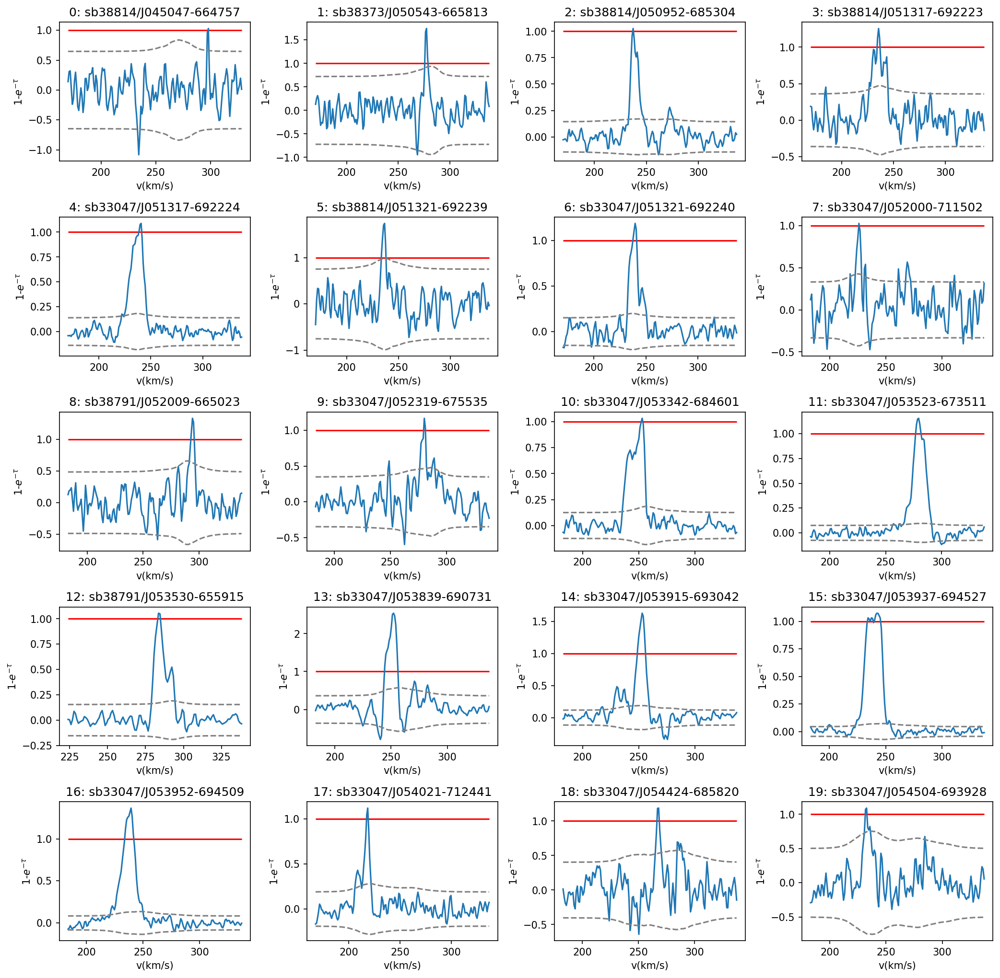

In [19]:
with open(datapathbase + '/output_data/LMC_fitting/saturated_spectra.txt', 'r') as file:
    saturated_name = [line.strip() for line in file.readlines()]
    
saturated_name=np.array(saturated_name)
indices = np.where(np.isin(nlist, saturated_name))[0]

p_include=[2,3,4,6,7,8,9,10,11,12,15,17,18,19]


plt.figure(figsize=(14,16),dpi=150)

for i in range(len(saturated_name)):
    plt.subplot(6,4,i+1)
    j=indices[i]
    x,y,yerr,xemi,yemi,yemi_err,yemi_selferr=rd.get_emi_abs_data(nlist[j],nabs[j],1,1,mode='LMC',v_move=0.)
    #plt.plot(xemi,yemi/yemi.max())
    plt.plot(x,y)
    plt.hlines(y=1,xmin=x.min(), xmax=x.max(),color='r', linestyle='-',)
    plt.plot(x,yerr*3,c='gray',ls='--')
    plt.plot(x,-yerr*3,c='gray',ls='--') 
    plt.title('%d: '%i+nabs[j][-43:-36]+'/'+nlist[j])
    plt.xlabel('v(km/s)')
    plt.ylabel(r'1-$e^{-\tau}$')
    #print(i, nabs[j][-43:-36]+'/'+nlist[j])
    j+=1
plt.tight_layout()

## bad absorption data

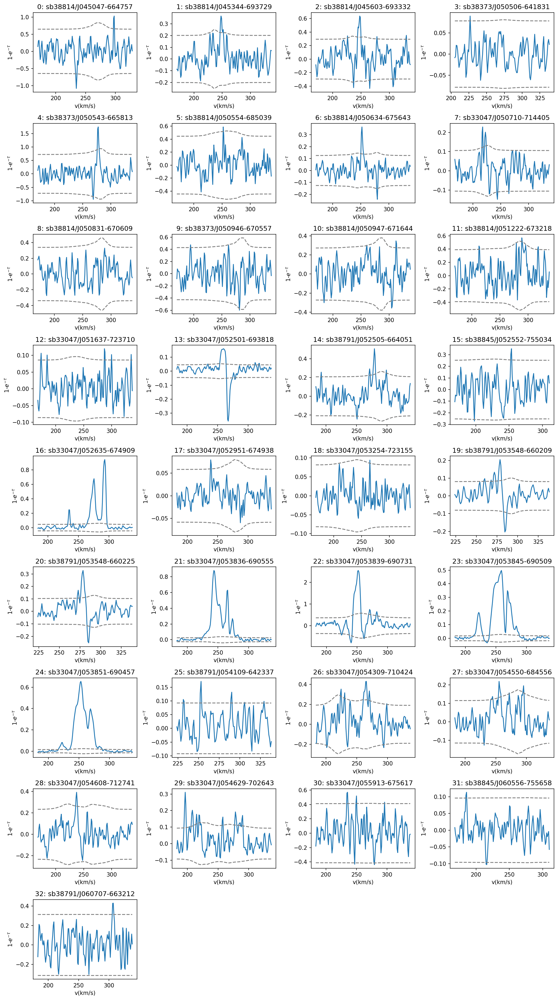

In [20]:
with open(datapathbase + '/output_data/LMC_fitting/bad_absorption_data.txt', 'r') as file:
    bad_data_name = [line.strip() for line in file.readlines()]
    
bad_data_name=np.array(bad_data_name)
indices = np.where(np.isin(nlist, bad_data_name))[0]


plt.figure(figsize=(14,25),dpi=150)

for i in range(len(bad_data_name)):
    plt.subplot(9,4,i+1)
    j=indices[i]
    x,y,yerr,xemi,yemi,yemi_err,yemi_selferr=rd.get_emi_abs_data(nlist[j],nabs[j],1,1,mode='LMC',v_move=0.)
    #plt.plot(xemi,yemi/yemi.max())
    plt.plot(x,y)
    plt.plot(x,yerr*3,c='gray',ls='--')
    plt.plot(x,-yerr*3,c='gray',ls='--') 
    #plt.hlines(y=1,xmin=x.min(), xmax=x.max(),color='r', linestyle='-',)
    plt.title('%d: '%i+nabs[j][-43:-36]+'/'+nlist[j])
    plt.xlabel('v(km/s)')
    plt.ylabel(r'1-$e^{-\tau}$')
    #print(i, nabs[j][-43:-36]+'/'+nlist[j])
    j+=1
plt.tight_layout()

In [21]:
exclude_data=np.append(bad_data_name,saturated_name)
exclude_data.shape

(53,)

## final dataset

In [19]:
exclude_data

array(['J045047-664757', 'J045344-693729', 'J045603-693332',
       'J050506-641831', 'J050543-665813', 'J050554-685039',
       'J050634-675643', 'J050710-714405', 'J050831-670609',
       'J050946-670557', 'J050947-671644', 'J051222-673218',
       'J051637-723710', 'J052501-693818', 'J052505-664051',
       'J052552-755034', 'J052635-674909', 'J052951-674938',
       'J053254-723155', 'J053548-660209', 'J053548-660225',
       'J053836-690555', 'J053839-690731', 'J053845-690509',
       'J053851-690457', 'J054109-642337', 'J054309-710424',
       'J054550-684556', 'J054608-712741', 'J054629-702643',
       'J055913-675617', 'J060556-755658', 'J060707-663212',
       'J045047-664757', 'J050543-665813', 'J050952-685304',
       'J051317-692223', 'J051317-692224', 'J051321-692239',
       'J051321-692240', 'J052000-711502', 'J052009-665023',
       'J052319-675535', 'J053342-684601', 'J053523-673511',
       'J053530-655915', 'J053839-690731', 'J053915-693042',
       'J053937-694527',

In [22]:
CNMonlydata=CNMonlydata_[~CNMonlydata_['Name'].isin(exclude_data)]
WNMonlydata=WNMonlydata_[~WNMonlydata_['Name'].isin(exclude_data)]
Fulldata=Fulldata_[~Fulldata_['Name'].isin(exclude_data)]

Fulldata.shape


(171, 15)

In [23]:
CNMonlydata_out=CNMonlydata_[CNMonlydata_['Name'].isin(name_outskirts)]
WNMonlydata_out=WNMonlydata_[WNMonlydata_['Name'].isin(name_outskirts)]
Fulldata_out=Fulldata_[Fulldata_['Name'].isin(name_outskirts)]
new=CNMonlydata_out.drop_duplicates(subset='Name', keep='first')
Fulldata_out=Fulldata_out.merge(new[['Name','ra','dec']],on='Name')
Fulldata_out.shape

(24, 17)

In [ ]:
#exclude very close samples
def calculate_distance_matrix(ra_list, dec_list):
    """
    Calculate the angular distance matrix for lists of RA and Dec.

    Parameters:
    ra_list : list or array of Right Ascension in degrees
    dec_list : list or array of Declination in degrees

    Returns:
    dist_matrix : A 2D numpy array containing angular distances in degrees
                  between each pair of coordinates.
    """
    # Create an array of SkyCoord objects from the RA and Dec lists
    coords = SkyCoord(ra=ra_list*u.degree, dec=dec_list*u.degree, frame='icrs')
    
    # Initialize a matrix to hold the distances
    n = len(ra_list)
    dist_matrix = np.zeros((n, n))
    
    # Calculate the separation between each pair of coordinates
    for i in range(n):
        dist_matrix[i, :] = coords[i].separation(coords).degree

    return dist_matrix*3600

In [72]:
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
distance_matrix = calculate_distance_matrix(f_ra, f_dec)
p=np.argwhere(distance_matrix<15)
p_overlap=[]
for pp in p:
    if pp[0]!=pp[1]:
        p_overlap.append(pp)
np.array(p_overlap)

array([[  2,   3],
       [  3,   2],
       [ 12,  50],
       [ 13,  23],
       [ 14,  17],
       [ 17,  14],
       [ 18,  19],
       [ 18,  20],
       [ 18,  21],
       [ 19,  18],
       [ 19,  20],
       [ 19,  21],
       [ 20,  18],
       [ 20,  19],
       [ 20,  21],
       [ 21,  18],
       [ 21,  19],
       [ 21,  20],
       [ 23,  13],
       [ 24,  45],
       [ 27,  37],
       [ 32,  34],
       [ 34,  32],
       [ 37,  27],
       [ 39,  62],
       [ 39,  72],
       [ 44,  47],
       [ 44,  62],
       [ 45,  24],
       [ 46,  51],
       [ 46,  53],
       [ 46,  88],
       [ 46,  95],
       [ 46, 106],
       [ 46, 116],
       [ 46, 156],
       [ 47,  44],
       [ 47,  62],
       [ 50,  12],
       [ 51,  46],
       [ 51,  53],
       [ 51,  59],
       [ 51,  88],
       [ 51,  95],
       [ 51, 156],
       [ 53,  46],
       [ 53,  51],
       [ 53,  59],
       [ 53,  88],
       [ 53,  95],
       [ 53, 156],
       [ 54,  56],
       [ 54,

# plots

## Map

In [ ]:

# Define the figure and the grid layout
fig = plt.figure(figsize=(6, 3), dpi=500)
plt.rc('xtick', labelsize=5)
plt.rc('ytick', labelsize=5)
lmc_wcs = wcs.WCS(fit[0].header)
x1, x2, y1, y2 = 1, -1, 1, -1
lmc_wcs_cut = lmc_wcs[x1:x2, y1:y2]
datacuthi = NHI_total_LMC[x1:x2, y1:y2]
ax2 = plt.subplot(projection=lmc_wcs_cut, slices=('x', 'y'))
ax2.set_xlabel('RA ', fontsize=7)
ax2.set_ylabel('Dec', fontsize=7)
lon = ax2.coords[0]
lat = ax2.coords[1]
lon.set_ticks(spacing=9 * u.deg, color='white',)
lat.set_ticks(spacing=2 * u.deg, color='white')
ax2.coords.grid(linewidth=0.2, linestyle='solid')

plt.imshow(datacuthi, origin='lower', cmap='gray_r', vmin=1e-12, alpha=1)
#new_data=CNMonlydata.drop_duplicates
#ax2.scatter(Ra_Liu, Dec_Liu, s=0.1,
#           transform=ax2.get_transform('world'), c='blue', alpha=0.7,marker='x',label='Liu et al. 2021')

p=np.argwhere((Dec_LMC>-74)&(Dec_LMC<-64)).flatten()
x,y=Ra_LMC[p],Dec_LMC[p]
p=np.argwhere((x<x.max())).flatten()
x,y=x[p],y[p]
ax2.scatter(x,y,s=1,
           transform=ax2.get_transform('world'),c='red',label='GASKAP')
ax2.legend(fontsize='xx-small')


plt.show()


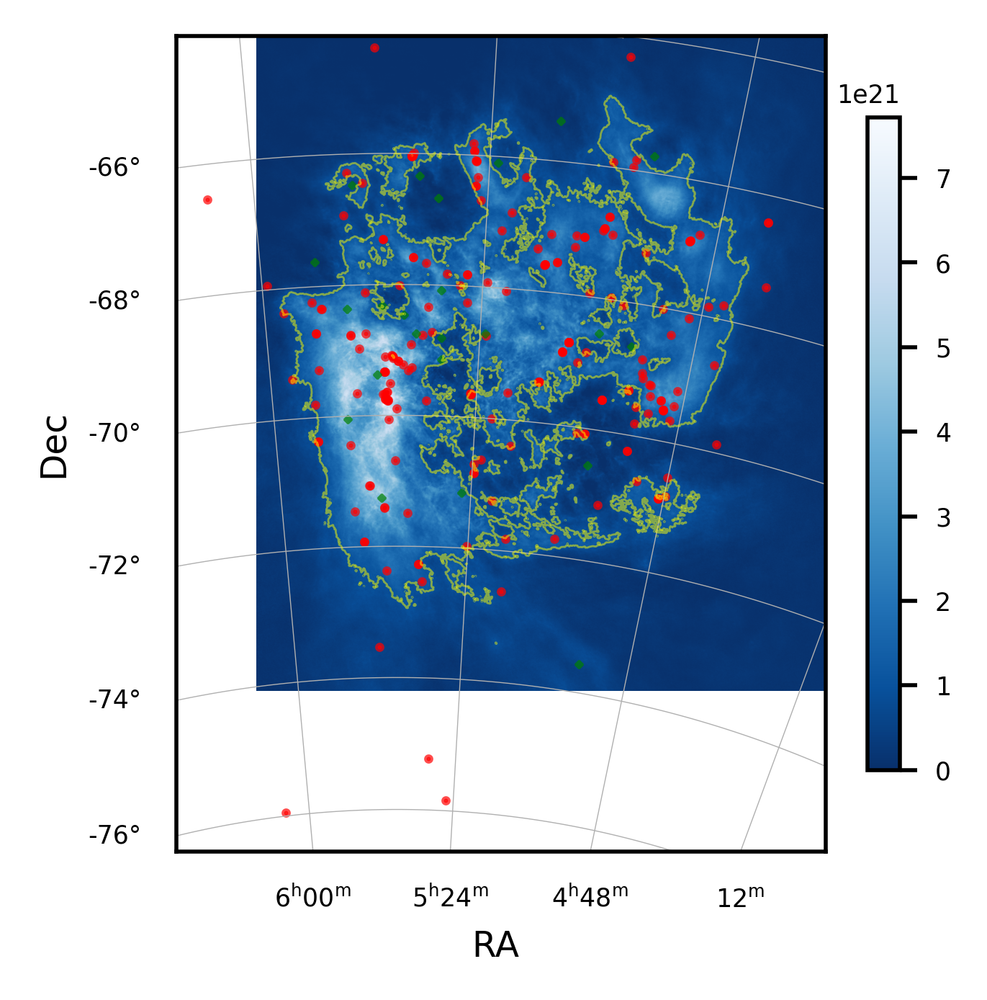

In [24]:


# Define the figure and the grid layout
fig = plt.figure(figsize=(6, 3), dpi=500)
grid = plt.GridSpec(1, 2, width_ratios=[1.2, 1])  # Adjust width ratios to make left plot larger

lmc_wcs = wcs.WCS(fit[0].header)
plt.rc('xtick', labelsize=5)
plt.rc('ytick', labelsize=5)


# Right plot
#x1, x2, y1, y2 = 220, -250, 320, -220
x1, x2, y1, y2 = 1, -1, 1, -1
lmc_wcs_cut = lmc_wcs[x1:x2, y1:y2]
datacuthi = NHI_total_LMC[x1:x2, y1:y2]
ax2 = fig.add_subplot(grid[0, 0], projection=lmc_wcs_cut, slices=('x', 'y'))
ax2.set_xlabel('RA ', fontsize=7)
ax2.set_ylabel('Dec', fontsize=7)
lon = ax2.coords[0]
lat = ax2.coords[1]
lon.set_ticks(spacing=9 * ut.deg, color='white',)
lat.set_ticks(spacing=2 * ut.deg, color='white')
ax2.coords.grid(linewidth=0.2, linestyle='solid')

plt.imshow(datacuthi, origin='lower', cmap='Blues_r', vmin=1e-12, alpha=1)
plt.colorbar(shrink=0.8)

y=np.nan_to_num(datacuthi,nan=0)
sigma = [3,3]
y = sp.ndimage.filters.gaussian_filter(y, sigma, mode='constant')
contour_levels = [1e21]
ax2.contour(y, levels=contour_levels, colors='yellow', linewidths=0.4,alpha=0.5)

#new_data=CNMonlydata.drop_duplicates
ax2.scatter(Ra_LMC, Dec_LMC, s=0.7,
           transform=ax2.get_transform('world'), c='r', label='selected points',alpha=0.7)

#new_data=CNMonlydata.drop_duplicates
ax2.scatter(Ra_shell, Dec_shell, s=0.7,
           transform=ax2.get_transform('world'), c='green', label='selected points',alpha=0.7,marker='x')
plt.show()


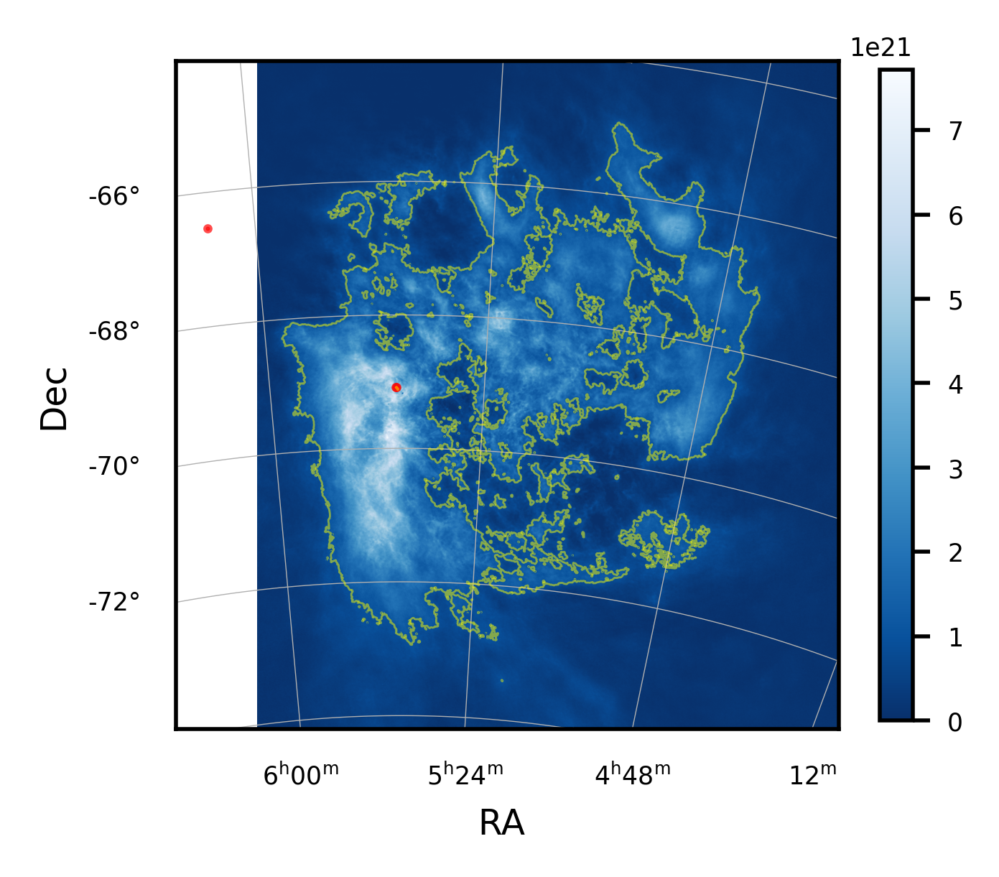

In [42]:


# Define the figure and the grid layout
fig = plt.figure(figsize=(6, 3), dpi=500)
grid = plt.GridSpec(1, 2, width_ratios=[1.2, 1])  # Adjust width ratios to make left plot larger

lmc_wcs = wcs.WCS(fit[0].header)
plt.rc('xtick', labelsize=5)
plt.rc('ytick', labelsize=5)


# Right plot
#x1, x2, y1, y2 = 220, -250, 320, -220
x1, x2, y1, y2 = 1, -1, 1, -1
lmc_wcs_cut = lmc_wcs[x1:x2, y1:y2]
datacuthi = NHI_total_LMC[x1:x2, y1:y2]
ax2 = fig.add_subplot(grid[0, 0], projection=lmc_wcs_cut, slices=('x', 'y'))
ax2.set_xlabel('RA ', fontsize=7)
ax2.set_ylabel('Dec', fontsize=7)
lon = ax2.coords[0]
lat = ax2.coords[1]
lon.set_ticks(spacing=9 * ut.deg, color='white',)
lat.set_ticks(spacing=2 * ut.deg, color='white')
ax2.coords.grid(linewidth=0.2, linestyle='solid')

plt.imshow(datacuthi, origin='lower', cmap='Blues_r', vmin=1e-12, alpha=1)
plt.colorbar(shrink=0.8)

y=np.nan_to_num(datacuthi,nan=0)
sigma = [3,3]
y = sp.ndimage.filters.gaussian_filter(y, sigma, mode='constant')
contour_levels = [1e21]
ax2.contour(y, levels=contour_levels, colors='yellow', linewidths=0.4,alpha=0.5)

r=[84.687500,84.712500,91.779167 ]
d=[-69.085833,-69.082500,-66.536667]
#new_data=CNMonlydata.drop_duplicates
ax2.scatter(r, d, s=0.7,
           transform=ax2.get_transform('world'), c='r', label='selected points',alpha=0.7)
plt.show()


## fitting analysis

In [20]:

np.mean(CNMonlydata.popt0.to_numpy().astype(float)),np.mean(CNMonlydata.mean_Ts.to_numpy().astype(float)),np.mean(Fulldata.f_c.to_numpy().astype(float))

(0.6259277196608026, 46.78426238184468, 0.2584495650212552)

In [86]:
np.log10(WNMonlydata_out.NHI_w.to_numpy().astype(float)*1e20)

array([20.43595625, 20.43612799, 20.63395003, 20.85343934, 20.41295325,
       20.12115065, 20.2829061 , 20.24547161, 20.59827337, 20.60138775,
       20.58309905, 20.56650661, 20.59980653, 20.8455113 , 20.4482412 ,
       20.85189224, 20.4398599 , 20.8531094 , 20.43324034, 20.81045431,
       20.70649756, 20.46646182, 20.67634438, 20.3775612 , 20.67355175,
       20.39287968, 20.59682365, 20.53022965, 20.14036561, 20.28074218,
       20.6401524 , 20.69348017, 20.78034052, 20.6265722 ])

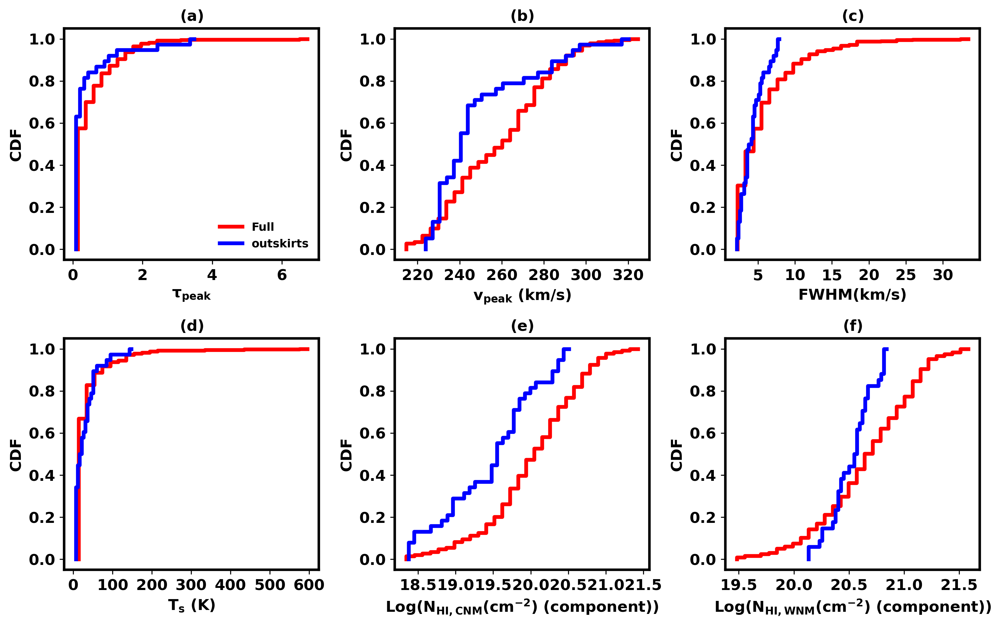

In [ ]:
# Reload your module if needed
reload(anap)

plt.figure(figsize=(11,7),dpi=300)

# Define the subplots
subplots = [231, 232, 233, 234, 235, 236]

# Data and labels for each subplot
data_and_labels = [
    (anap.cdf(CNMonlydata.popt0.to_numpy().astype(float)), 'Full', 'r', r'$\mathbf{\tau_{peak}}$', 'CDF'
    ,r'$\mathbf{(a)}$',anap.cdf(CNMonlydata_out.popt0.to_numpy().astype(float)),'outskirts','b'),
    (anap.cdf(CNMonlydata.popt1.to_numpy().astype(float)), 'LMC Comp', 'r', r'$\mathbf{v_{peak}}$ (km/s)', 'CDF'
    ,r'$\mathbf{(b)}$',anap.cdf(CNMonlydata_out.popt1.to_numpy().astype(float)),'outskirts','b'),
    (anap.cdf(CNMonlydata.fwhm.to_numpy().astype(float)), 'LMC', 'r', r'FWHM(km/s)', 'CDF'
    ,r'$\mathbf{(c)}$',anap.cdf(CNMonlydata_out.fwhm.to_numpy().astype(float)),'outskirts','b'),
    (anap.cdf(CNMonlydata.mean_Ts.to_numpy().astype(float)), 'LMC', 'r', r'$\mathbf{T_s}$ (K)', 'CDF'
    ,r'$\mathbf{(d)}$',anap.cdf(CNMonlydata_out.mean_Ts.to_numpy().astype(float)),'outskirts','b'),
    (anap.cdf(np.log10(CNMonlydata.NHI_c.to_numpy().astype(float)*1e20)), 'LMC', 'r', r'Log($\mathbf{N_{HI,CNM}(cm^{-2})}$ (component))', 'CDF'
    ,r'$\mathbf{(e)}$',anap.cdf(np.log10(CNMonlydata_out.NHI_c.to_numpy().astype(float)*1e20)),'outskirts','b'),
    (anap.cdf(np.log10(WNMonlydata.NHI_w.to_numpy().astype(float)*1e20)), 'LMC', 'r', r'Log($\mathbf{N_{HI,WNM}(cm^{-2})}$ (component))', 'CDF'
    ,r'$\mathbf{(f)}$',anap.cdf(np.log10(WNMonlydata_out.NHI_w.to_numpy().astype(float)*1e20)),'outskirts','b')
]

# Create each subplot
for i, subplot in enumerate(subplots):
    plt.subplot(subplot)
    
    x1, y1 = data_and_labels[i][0]
    plt.step(x1, y1, label=data_and_labels[i][1], c=data_and_labels[i][2], lw=3)
    x1, y1 = data_and_labels[i][-3]
    plt.step(x1, y1, label=data_and_labels[i][-2], c=data_and_labels[i][-1], lw=3)

    
    plt.xlabel(data_and_labels[i][3], fontsize=12, fontweight='bold')
    plt.ylabel(data_and_labels[i][4], fontsize=12, fontweight='bold')
    plt.title(data_and_labels[i][-4])
    

    # Log scale for subplots 234 and 235
    #if i == 4 or i == 5:  
    #    plt.xscale('log')

    if i==0:
        plt.legend(framealpha=0, prop={'size': 9, 'weight': 'bold'})
    
    ax = plt.gca()
    ax.tick_params(axis='both', which='major', labelsize=9)
    ax.tick_params(axis='both', which='minor', labelsize=9)
    
    # Make the tick labels bold by setting font properties
    for tick in ax.xaxis.get_major_ticks():
        tick.label1.set_fontsize(12)
        tick.label1.set_fontweight('bold')
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label1.set_fontsize(12)
        tick.label1.set_fontweight('bold')
    
    # Make the outline of each figure bold
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

plt.tight_layout()
plt.show()


In [64]:
(Fulldata.NHI_w.to_numpy().astype(float)*1e20)[:3]

array([0.00000000e+00, 1.95009111e+21, 2.72870291e+20])

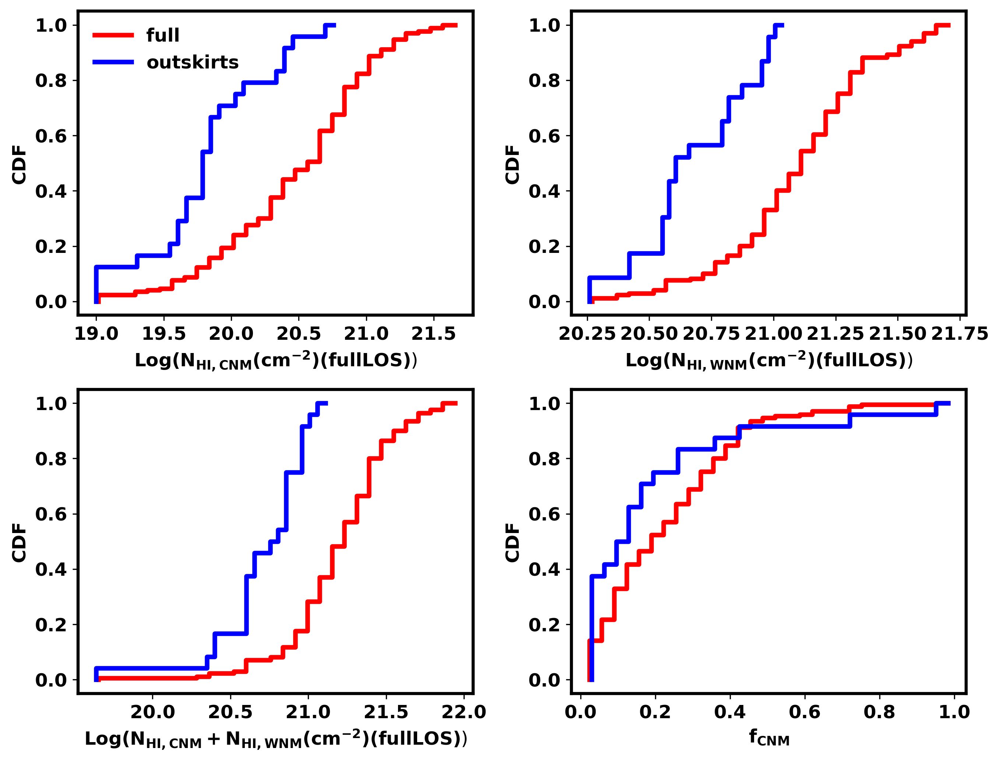

In [35]:
# Reload your module if needed
reload(anap)

plt.figure(figsize=(9, 7), dpi=300)

# Define the subplots
subplots = [221, 222, 223, 224]

a=Fulldata.NHI_w.to_numpy().astype(float)*1e20
b=Fulldata_out.NHI_w.to_numpy().astype(float)*1e20

# Data and labels for each subplot
data_and_labels = [
    (anap.cdf(np.log10(Fulldata.NHI_c.to_numpy().astype(float)*1e20)),  'full', 'r', r'Log($\mathbf{N_{HI,CNM}(cm^{-2}) (full LOS)})$', 'CDF',anap.cdf(np.log10(Fulldata_out.NHI_c.to_numpy().astype(float)*1e20)),  'outskirts', 'b'),
    (anap.cdf(np.log10(a[a>0])), 'LMC', 'r', r'Log($\mathbf{N_{HI,WNM}(cm^{-2}) (full LOS)})$', 'CDF',
     anap.cdf(np.log10(b[b>0])), 'LMC', 'b'),
    (anap.cdf(np.log10(Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20)), 'LMC', 'r', 
     r'Log($\mathbf{N_{HI,CNM} + N_{HI,WNM}(cm^{-2}) (full LOS)})$', 'CDF',
     anap.cdf(np.log10(Fulldata_out.NHI_c.to_numpy().astype(float)*1e20 + Fulldata_out.NHI_w.to_numpy().astype(float)*1e20)),' ','b'),
     #anap.cdf(NHI_21Sponge[NHI_21Sponge<20]*1e20)),
    (anap.cdf(Fulldata.f_c.to_numpy().astype(float)),'LMC', 'r', r'$\mathbf{f_{CNM}}$', 'CDF',
     anap.cdf(Fulldata_out.f_c.to_numpy().astype(float)),'LMC', 'b')
]

# Create each subplot
for i, subplot in enumerate(subplots):
    plt.subplot(subplot)
    
    x1, y1 = data_and_labels[i][0]
    plt.step(x1, y1, label=data_and_labels[i][1], c=data_and_labels[i][2],lw=3)
    
    x1, y1 = data_and_labels[i][-3]
    plt.step(x1, y1, label=data_and_labels[i][-2], c=data_and_labels[i][-1],lw=3)
    
    plt.xlabel(data_and_labels[i][3], fontsize=12, fontweight='bold')
    plt.ylabel(data_and_labels[i][4], fontsize=12, fontweight='bold')
    
    if i==0:
        plt.legend(framealpha=0, prop={'size': 12, 'weight': 'bold'})
    
    #if i !=3:  # For log scale on x-axis in the third and fourth subplot
    #    plt.xscale('log')
        
    
   # if i==0:
   #     plt.legend(framealpha=0, prop={'size': 12, 'weight': 'bold'})
    
    ax = plt.gca()
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.tick_params(axis='both', which='minor', labelsize=10)
    
    # Make the tick labels bold by setting font properties
    for tick in ax.xaxis.get_major_ticks():
        tick.label1.set_fontsize(12)
        tick.label1.set_fontweight('bold')
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label1.set_fontsize(12)
        tick.label1.set_fontweight('bold')
    
    # Make the outline of each figure bold
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

plt.tight_layout()
plt.show()

In [34]:
a=CNMonlydata.mean_Ts.to_numpy().astype(float)
c=CNMonlydata.Name.to_numpy().astype(str)
p=np.where(a>250)
d=Fulldata.f_c.to_numpy().astype(float)
dd=Fulldata.Name.to_numpy().astype(str)
p2=np.where(d>0.6)
c[p],dd[p2]

(array(['J051832-693524', 'J050501-664516', 'J052456-693855'], dtype='<U14'),
 array(['J044047-695217', 'J045608-701434', 'J050709-690101',
        'J050501-664516', 'J052626-655623', 'J045114-693123',
        'J051340-670640', 'J053657-691329'], dtype='<U14'))

In [118]:
t=CNMonlydata.mean_Ts.to_numpy().astype(float)
np.mean(t),np.shape(t)

(46.58860290311606, (408,))

/usr/users/hchen/.local/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in less
  from ipykernel import kernelapp as app


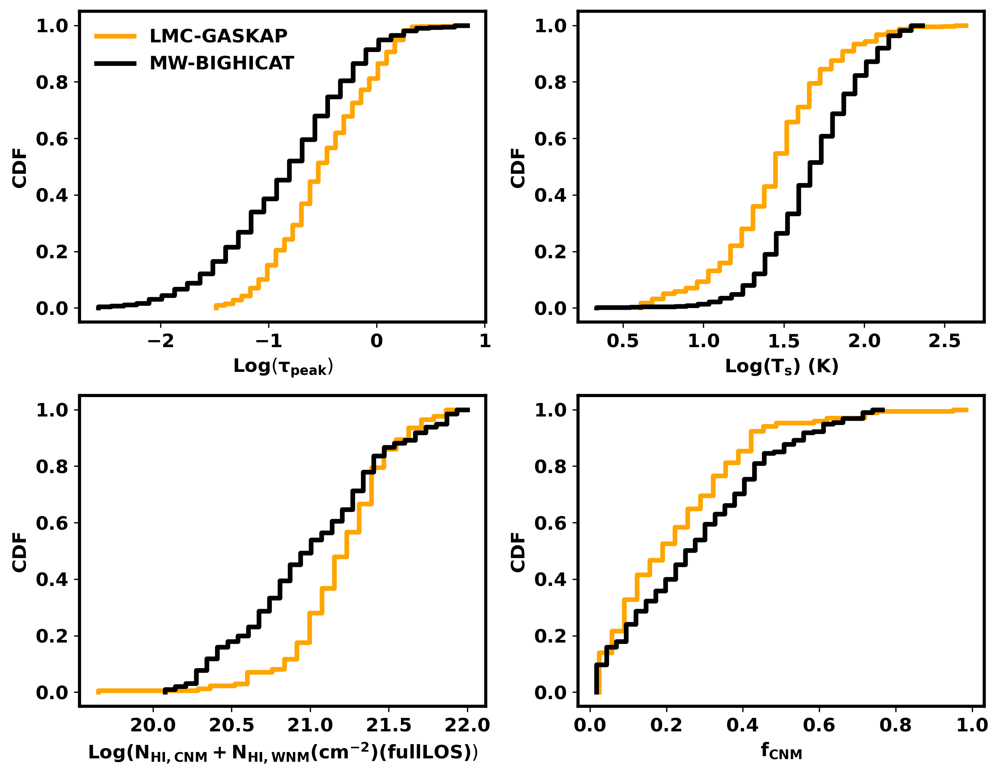

In [57]:
# Reload your module if needed
reload(anap)

plt.figure(figsize=(9, 7), dpi=300)

# Define the subplots
subplots = [221, 222, 223, 224]

a=Fulldata.NHI_w.to_numpy().astype(float)*1e20
b=Fulldata_out.NHI_w.to_numpy().astype(float)*1e20

# Data and labels for each subplot
t=BIGHICAT_Gauss.tau.to_numpy().astype(float)
s=BIGHICAT_Gauss.Ts.to_numpy().astype(float)
p=np.argwhere(s<250).flatten()
t,s=t[p],s[p]
p=np.argwhere(t<10).flatten()
t,s=t[p],s[p]
t=np.log10(t)

big_f=BIGHICAT_LOS.f_CNM_250K.to_numpy().astype(float)
big_f=np.nan_to_num(big_f)
big_n=np.log10(BIGHICAT_LOS.NHI_LOS.to_numpy().astype(float)*1e20)
p=np.argwhere(big_f>0.).flatten()
big_f,big_n=big_f[p],big_n[p]


data_and_labels = [
    (anap.cdf(np.log10(CNMonlydata.popt0.to_numpy().astype(float))), 'LMC-GASKAP', 'orange', r'Log$(\mathbf{\tau_{peak}})$', 'CDF'
    ,anap.cdf(t),'MW-BIGHICAT','black'),
    (anap.cdf(np.log10(CNMonlydata.mean_Ts.to_numpy().astype(float))), 'LMC', 'orange', r'Log($\mathbf{T_s}$) (K)', 'CDF'
    ,anap.cdf(np.log10(s)),'BIGHICAT','black'),
    (anap.cdf(np.log10(Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20)), 'LMC', 'orange', 
     r'Log($\mathbf{N_{HI,CNM} + N_{HI,WNM}(cm^{-2}) (full LOS)})$', 'CDF',
     anap.cdf(big_n),'21-SPONGE','black', ),
     #anap.cdf(np.log10(NHI_21Sponge*1e20)),'21-SPONGE','b', anap.cdf(np.log10(NHI_HT03*1e20)),'HT03',),
     #anap.cdf(NHI_21Sponge[NHI_21Sponge<20]*1e20)),
    (anap.cdf(Fulldata.f_c.to_numpy().astype(float)),'LMC', 'orange', r'$\mathbf{f_{CNM}}$', 'CDF',
     anap.cdf(big_f),'LMC', 'black',anap.cdf(fCNM_HT03),'HT03')
     #anap.cdf(fCNM_21Sponge),'LMC', 'b',anap.cdf(fCNM_HT03),'HT03')
]

# Create each subplot
for i, subplot in enumerate(subplots):
    plt.subplot(subplot)
    
    x1, y1 = data_and_labels[i][0]
    plt.step(x1, y1, label=data_and_labels[i][1], c=data_and_labels[i][2],lw=3)
    
    x1, y1 = data_and_labels[i][5]
    plt.step(x1, y1, label=data_and_labels[i][6], c=data_and_labels[i][7],lw=3)
    
    plt.xlabel(data_and_labels[i][3], fontsize=12, fontweight='bold')
    plt.ylabel(data_and_labels[i][4], fontsize=12, fontweight='bold')
    #if i>1:
    #    x1, y1 = data_and_labels[i][5]
    #    plt.step(x1, y1, label='21-SPONGE', c='gray',lw=3,alpha=0.9)
    #    x1, y1 = data_and_labels[i][8]
        #plt.step(x1, y1, label='HT03', c='blue',lw=3,alpha=0.9)
    if i==0:
        plt.legend(framealpha=0, prop={'size': 12, 'weight': 'bold'})
    #if i==0:
    #    plt.legend(framealpha=0, prop={'size': 12, 'weight': 'bold'})
    
    #if i !=3:  # For log scale on x-axis in the third and fourth subplot
    #    plt.xscale('log')
        
    
   # if i==0:
   #     plt.legend(framealpha=0, prop={'size': 12, 'weight': 'bold'})
    
    ax = plt.gca()
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.tick_params(axis='both', which='minor', labelsize=10)
    
    # Make the tick labels bold by setting font properties
    for tick in ax.xaxis.get_major_ticks():
        tick.label1.set_fontsize(12)
        tick.label1.set_fontweight('bold')
    
    for tick in ax.yaxis.get_major_ticks():
        tick.label1.set_fontsize(12)
        tick.label1.set_fontweight('bold')
    
    # Make the outline of each figure bold
    for spine in ax.spines.values():
        spine.set_linewidth(2)
        spine.set_edgecolor('black')

plt.tight_layout()
plt.show()

In [51]:
t=BIGHICAT_Gauss.tau.to_numpy().astype(float)
s=BIGHICAT_Gauss.Ts.to_numpy().astype(float)
p=np.argwhere(s<250).flatten()
t,s=t[p],s[p]
p=np.argwhere(t<10).flatten()
t,s=t[p],s[p]
np.mean(s)


/usr/users/hchen/.local/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in less
  This is separate from the ipykernel package so we can avoid doing imports until


70.41606593329949

In [28]:
a=Fulldata.Sigma_fc.to_numpy().astype(float)
b=Fulldata.Name.to_numpy().astype(str)
p=np.where(a>1)[0]
b[p]


array(['J045541-690629', 'J054011-691954', 'J052635-674909'], dtype='<U14')

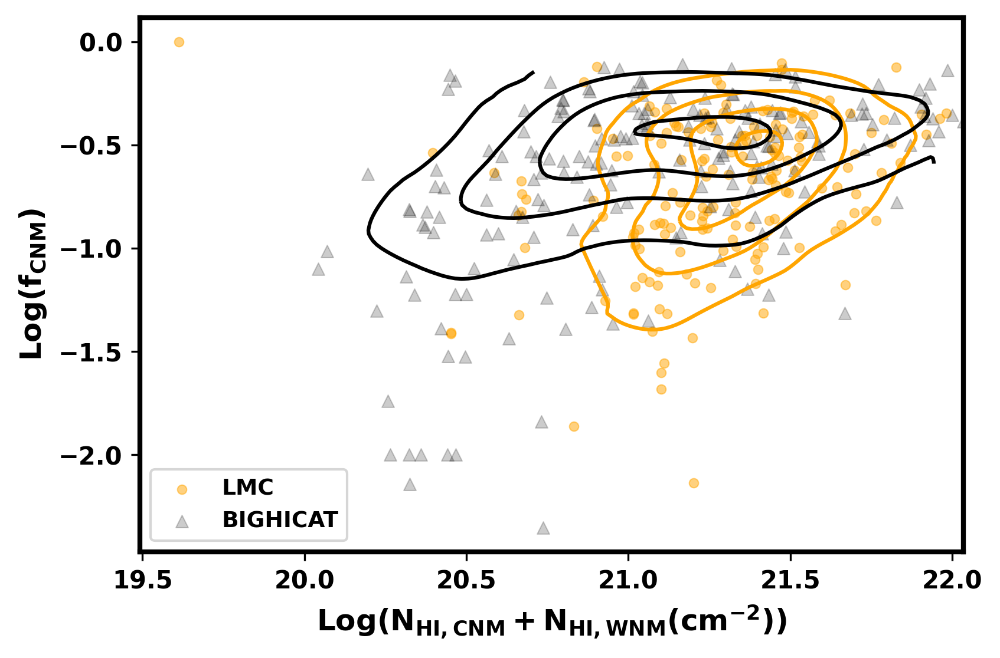

In [41]:
reload(anap)
fig, ax = plt.subplots(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)


# Plot LMC data
x_LMC = np.log10((Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20))
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
f_c_LMC_err=Fulldata.Sigma_fc.to_numpy().astype(float)
y_LMC = np.log10(f_c_LMC)
plt.scatter(x_LMC, y_LMC, s=14, label='LMC',c='orange',alpha=0.5,linewidth=0.5)
#plt.errorbar(x_LMC, y_LMC,f_c_LMC_err, label='LMC',fmt='o',ms=3,capsize=3, elinewidth=1.5,color='red')
#anap.plot_binned_data(x_LMC, y_LMC,num_bins=10,c='red')
anap.plot_density_contours(x_LMC, y_LMC,ax,c='orange')

big_f=BIGHICAT_LOS.f_CNM_250K.to_numpy().astype(float)
big_f=np.nan_to_num(big_f)
big_n=np.log10(BIGHICAT_LOS.NHI_LOS.to_numpy().astype(float)*1e20)
p=np.argwhere(big_f>0.).flatten()
big_f,big_n=big_f[p],big_n[p]

x_LMC = big_n
f_c_LMC=big_f
y_LMC = np.log10(f_c_LMC)
plt.scatter(x_LMC, y_LMC, s=25,color='black', label='BIGHICAT',alpha=0.2,marker='^',linewidth=0.5)
anap.plot_density_contours(x_LMC, y_LMC,ax,c='black')
#anap.plot_binned_data(x_LMC, y_LMC,num_bins=10,c='black')
'''
x=NHI_21Sponge
y=fCNM_21Sponge
y_err=fCNM_21Sponge_err
plt.scatter(x,y,s=25,color='black', label='21-Sponge',alpha=0.4,marker='^')

x=NHI_HT03
y=fCNM_HT03
plt.scatter(x,y,s=25,color='blue', label='HT03',alpha=0.6,marker='x')
'''

plt.xlabel(r'Log($\mathbf{N_{HI,CNM}+N_{HI,WNM}(cm^{-2})}$)', fontsize=12, fontweight='bold')
plt.ylabel(r'Log($\mathbf{f_{CNM}}$)', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

# Show plot with numeric labels
plt.show()

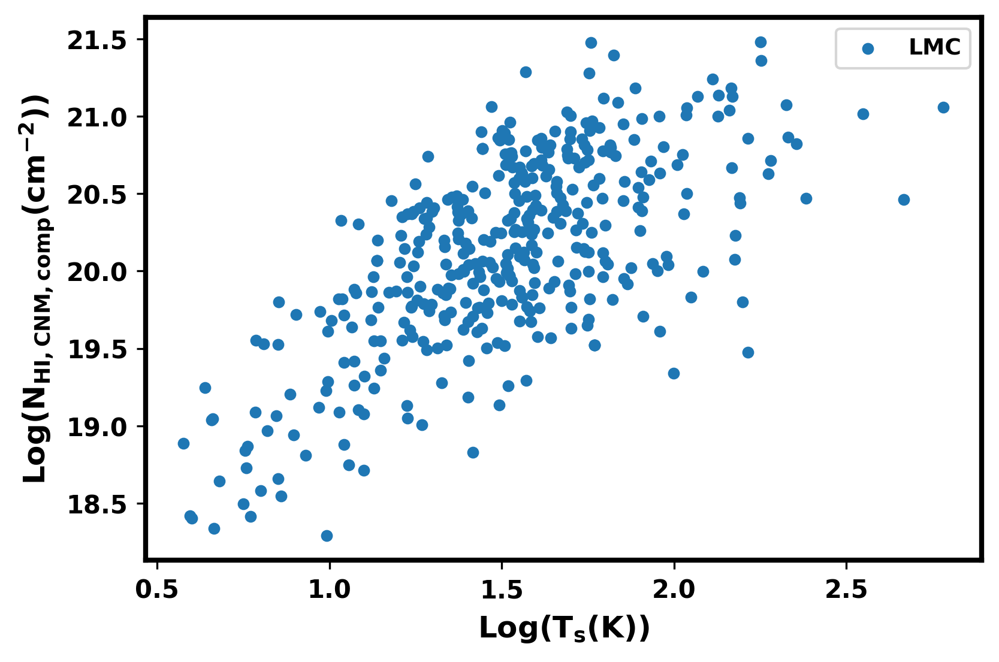

In [64]:

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)


# Plot LMC data
x_LMC = np.log10(CNMonlydata.mean_Ts.to_numpy().astype(float))
y_LMC = np.log10(CNMonlydata.NHI_c.to_numpy().astype(float)*1e20)
plt.scatter(x_LMC, y_LMC, s=14, label='LMC')
#plt.errorbar(x_LMC, y_LMC,f_c_LMC_err, label='LMC',fmt='o',ms=3,capsize=3, elinewidth=1.5,color='red')


plt.ylabel(r'Log($\mathbf{N_{HI,CNM,comp}(cm^{-2})}$)', fontsize=12, fontweight='bold')
plt.xlabel(r'Log($\mathbf{T_s(K)}$)', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

# Show plot with numeric labels
plt.show()

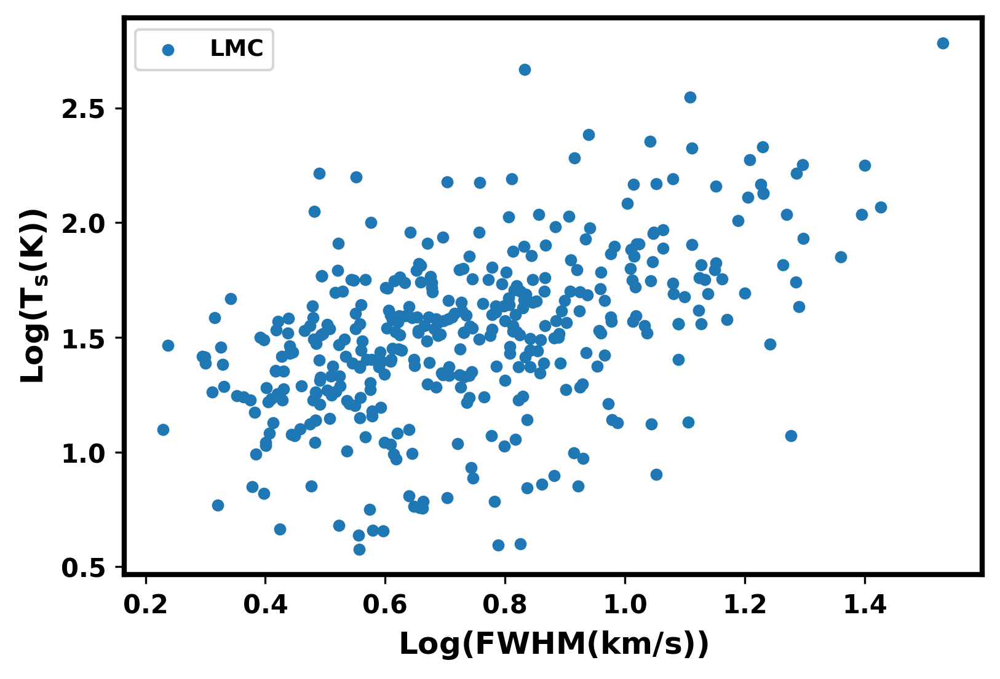

In [69]:

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)


# Plot LMC data
x_LMC = np.log10(CNMonlydata.fwhm.to_numpy().astype(float))
y_LMC = np.log10(CNMonlydata.mean_Ts.to_numpy().astype(float))
plt.scatter(x_LMC, y_LMC, s=14, label='LMC')
#plt.errorbar(x_LMC, y_LMC,f_c_LMC_err, label='LMC',fmt='o',ms=3,capsize=3, elinewidth=1.5,color='red')


plt.xlabel(r'Log($\mathbf{FWHM(km/s)}}$)', fontsize=12, fontweight='bold')
plt.ylabel(r'Log($\mathbf{T_s(K)}$)', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

# Show plot with numeric labels
plt.show()

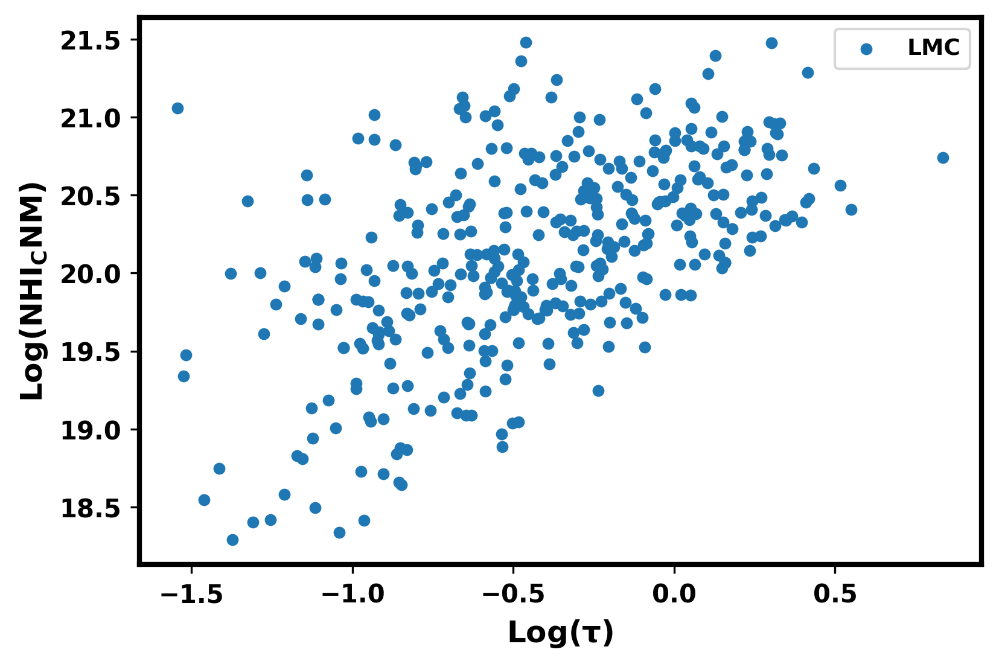

In [74]:

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)


# Plot LMC data
x_LMC = np.log10(CNMonlydata.popt0.to_numpy().astype(float))
y_LMC = np.log10(CNMonlydata.NHI_c.to_numpy().astype(float)*1e20)
plt.scatter(x_LMC, y_LMC, s=14, label='LMC')
#plt.errorbar(x_LMC, y_LMC,f_c_LMC_err, label='LMC',fmt='o',ms=3,capsize=3, elinewidth=1.5,color='red')


plt.xlabel(r'Log($\mathbf{\tau}}$)', fontsize=12, fontweight='bold')
plt.ylabel(r'Log($\mathbf{NHI_CNM}$)', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

# Show plot with numeric labels
plt.show()

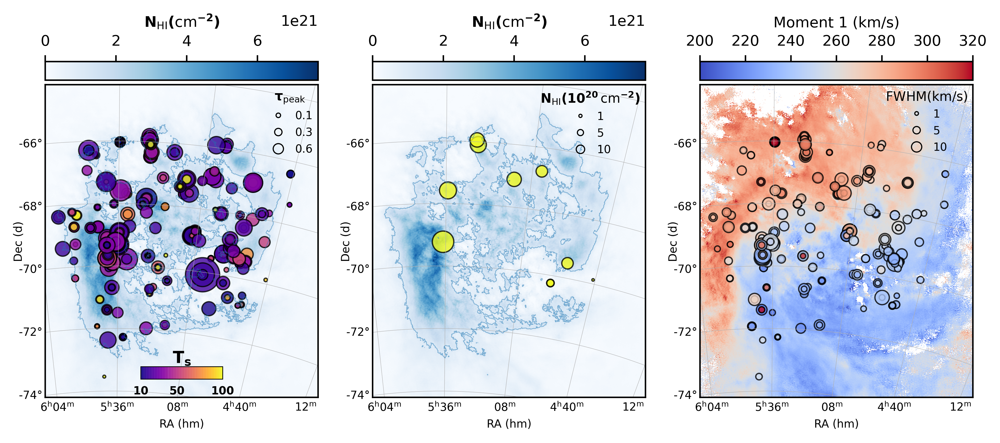

In [50]:
reload(rd)

def setup_subplot(ax, wcs_cut, data, cmap, vmin, vmax, xlabel, ylabel, clabel,scatter_data=None, scatter_props=None,
                 contour=[2e21]):
    """
    Set up the subplot with image, grid, and scatter if needed.
    """
    ax.set_xlabel(xlabel, fontsize=6,labelpad=1)
    ax.set_ylabel(ylabel, fontsize=6,labelpad=0)
    lon = ax.coords[0]
    lat = ax.coords[1]
    lon.set_ticks(spacing=7 * u.deg, color='white')
    lat.set_ticks(spacing=2 * u.deg, color='white')
    ax.coords.grid(linewidth=0.2, linestyle='solid')
    ax.tick_params(axis='y', which='major', labelsize=6, pad=-2)
    ax.tick_params(axis='x', which='major', labelsize=6, pad=-1)
    
    sc = plt.scatter(**scatter_data, **scatter_props)
    if len(contour)>0:
        y=np.nan_to_num(data,nan=0)
        sigma = [3,3]
        y = sp.ndimage.filters.gaussian_filter(y, sigma, mode='constant')
        contour_levels = contour
        ax.contour(y, levels=contour_levels, colors='tab:blue', transform=ax.get_transform(wcs_cut),
                    linewidths=0.4,alpha=0.5)
    img = plt.imshow(data, origin='lower', cmap=cmap, vmin=vmin, vmax=vmax)

    # Create a colorbar above the subplot
    cax = ax.figure.add_axes([ax.get_position().x0, ax.get_position().y1 + 0.005, 
                              ax.get_position().width, 0.02])  # Custom position
    cbar = plt.colorbar(img, cax=cax, orientation="horizontal")

    # Add a label to the colorbar
    cbar.set_label(clabel, fontsize=8)
    cbar.ax.xaxis.set_ticks_position('top')
    cbar.ax.xaxis.set_label_position('top')

    if scatter_data:
       
        return sc
    return None

def add_colorbar(ax, sc, ticks, title, color='black'):
    """
    Add a horizontal colorbar to the current axis.
    """
    axins1 = inset_axes(ax, width="30%", height="4%", loc=8, borderpad=1)
    cb = plt.colorbar(sc, cax=axins1, orientation="horizontal", ticks=ticks)
    cb.ax.tick_params(colors=color, labelsize=6, size=0, color=color, width=1.5)  # width makes the tick lines bold
    for label in cb.ax.get_xticklabels():
        label.set_fontweight('bold')  # Set tick labels to bold
        
    #cb.outline.set_visible(False)
    cb.ax.tick_params(labelsize=6, size=0, color=color)
    cb.ax.set_title(title, fontsize=9, loc='center', color=color,fontweight='bold',pad=1.5)
    cb.outline.set_visible(True)  # Make sure the outline is visible
    cb.outline.set_edgecolor('black')  # Set the edge color to black
    cb.outline.set_linewidth(0.4)  # Set the width of the black boundary

def add_size_legend(ax, size_labels, title, color, ncol=3, p=1):
    """
    Add a size legend to the axis.
    """
    if p==1:
        #size_labels = [f'{(v-1)/50:.2f}'for v in size_values]
        size_values = [v*50+1 for v in size_labels]
    elif p==3:
        #size_labels = [f'{(v-1)/3:.2f}' for v in size_values]
        size_values = [v*3+1 for v in size_labels]
    else:
        #size_labels = [f'{(v-1)/2}' for v in size_values]
        size_values = [v*2+1 for v in size_labels]

    handles = [Line2D([0], [0], marker='o', color='w', linestyle='None', label=label,
                      markersize=np.sqrt(size), markerfacecolor='None',
                      alpha=1, markeredgewidth=0.6, markeredgecolor='black')
               for size, label in zip(size_values, size_labels)]
    
    legend = ax.legend(handles=handles, title=title, loc='upper right', fontsize=6, title_fontsize=7,
                       frameon=False, labelspacing=0.5, handletextpad=0.5, borderpad=0)
    plt.setp(legend.get_texts(), color=color)
    plt.setp(legend.get_title(), color=color)


Ts_vmin, Ts_vmax = 10, 100  # Example range for Ts
fc_vmin, fc_vmax = 0.05, 0.8  # Example range for fc

# Plot configuration
plt.figure(figsize=(9, 7), dpi=500)
lmc_wcs = wcs.WCS(fit[0].header)

lmc_wcs_cut = lmc_wcs
datacuthi = NHI_total_LMC
datamom = Moment1_LMC

ra=CNMonlydata.ra.to_numpy().astype(float)
dec=CNMonlydata.dec.to_numpy().astype(float)
Ts=CNMonlydata.mean_Ts.to_numpy().astype(float)
tau=CNMonlydata.popt0.to_numpy().astype(float)
vpeak=CNMonlydata.popt1.to_numpy().astype(float)
fwhm=CNMonlydata.fwhm.to_numpy().astype(float)
#fwhm[fwhm<10]=2
#fwhm[fwhm>10]=18

ax = plt.subplot(231, projection=lmc_wcs_cut, slices=('x', 'y'))
sc = setup_subplot(ax, lmc_wcs_cut, datacuthi, cmap='Blues', vmin=1e-12, vmax=None,
                   xlabel='RA (hm)', ylabel='Dec (d)',clabel=r"$\mathbf{N_{\mathrm{HI}} (\mathrm{cm}^{-2})}$", scatter_data={
                       'x': ra, 'y': dec, 'transform': ax.get_transform('world')
                   }, scatter_props={
                       'marker': 'o', 'c': Ts, 'cmap': 'plasma', 'alpha': 0.8,'vmin': Ts_vmin, 'vmax': Ts_vmax,
                       's': tau * 50 + 1, 'edgecolor': 'black', 'linewidth': 0.7
                   },contour=[1e21])
add_colorbar(ax, sc, ticks=[10,50,100], title=r'$\mathbf{T_s}$', color='black')
add_size_legend(ax, [0.1,0.3,0.6], title=r"$\mathbf{\tau_{\mathbf{\mathrm{peak}}}}$", color='black',p=1)

#add_colorbar(ax, sc, ticks=[40, 80], title=r'$\mathbf{T_s}$', color='black')
#add_size_legend(ax, [5, 15, 20], title=r"$\mathbf{\tau_{\mathbf{\mathrm{peak}}}}$", color='black')

# Subplot 6
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
f_c_LMC[f_c_LMC<0.5]=0.05
f_c_LMC[f_c_LMC>0.5]=0.8
p=np.argwhere(f_c_LMC>0.5).flatten()
a_,f_ra,f_dec,f_c_LMC=a_[p],f_ra[p],f_dec[p],f_c_LMC[p]
ax = plt.subplot(232, projection=lmc_wcs_cut, slices=('x', 'y'))
sc = setup_subplot(ax, lmc_wcs_cut, datacuthi, cmap='Blues', vmin=1e-12, vmax=None,
                   xlabel='RA (hm)', ylabel='Dec (d)',clabel=r"$\mathbf{N_{\mathrm{HI}} (\mathrm{cm}^{-2})}$", scatter_data={
                       'x': f_ra, 'y': f_dec, 'transform': ax.get_transform('world')
                   }, scatter_props={
                       'marker': 'o', 'c': f_c_LMC, 'cmap': 'plasma', 'alpha': 0.8,'vmin': fc_vmin, 'vmax': fc_vmax,
                       's': a_ / 1e20 *2 + 1,
                       #'s':25 ,
                       'edgecolor': 'black', 'linewidth': 0.7
                   },contour=[1e21])
#add_colorbar(ax, sc, ticks=[0.2,0.5,0.8], title=r'$\mathbf{f_c}$', color='black')
add_size_legend(ax, [1,5,10], title=r"$\mathbf{N_{\mathrm{HI}} (10^{20} \, \mathrm{cm}^{-2})}$", color='black',p=2)
#ax.scatter(Ra_shell_g,Dec_shell_g,s=0.2,marker='+',
#           transform=ax.get_transform('world'),c='orange',label='selected points')
for m in range(len(Ra_shell_g)):
    circle = SphericalCircle((Ra_shell_g[m]*u.deg, Dec_shell_g[m]*u.deg), radius_shell_LMC[m]*u.deg,
                             edgecolor='red', 
                    facecolor='none', 
                        transform=ax.get_transform('world'),lw=.3)
#    ax.add_patch(circle)


# Subplot 5
ax = plt.subplot(233, projection=lmc_wcs_cut, slices=('x', 'y'))
sc = setup_subplot(ax, lmc_wcs_cut, datamom, cmap='coolwarm', vmin=200, vmax=320,
                   xlabel='RA (hm)', ylabel='Dec (d)',clabel='Moment 1 (km/s)', scatter_data={
                       'x': ra, 'y': dec, 's': fwhm * 3 + 1,
                       #'c': vpeak_LMC_comp + [rap.lsr_to_helio_corr(Ra_new_LMC_comp[i], Dec_new_LMC_comp[i])
                                             # for i in range(len(Ra_new_LMC_comp))],
                       'c': vpeak,
                       'transform': ax.get_transform('world')
                   }, scatter_props={
                       'marker': 'o', 'cmap': 'coolwarm', 'alpha': 0.8, 'vmin': 200, 'vmax': 320,
                       'edgecolor': 'black', 'linewidth': 0.7
                   },contour=[])
add_size_legend(ax, [1,5,10], title=r"$\mathbf{\mathrm{FWHM (km/s)}}$", color='black', p=3)





## shell 

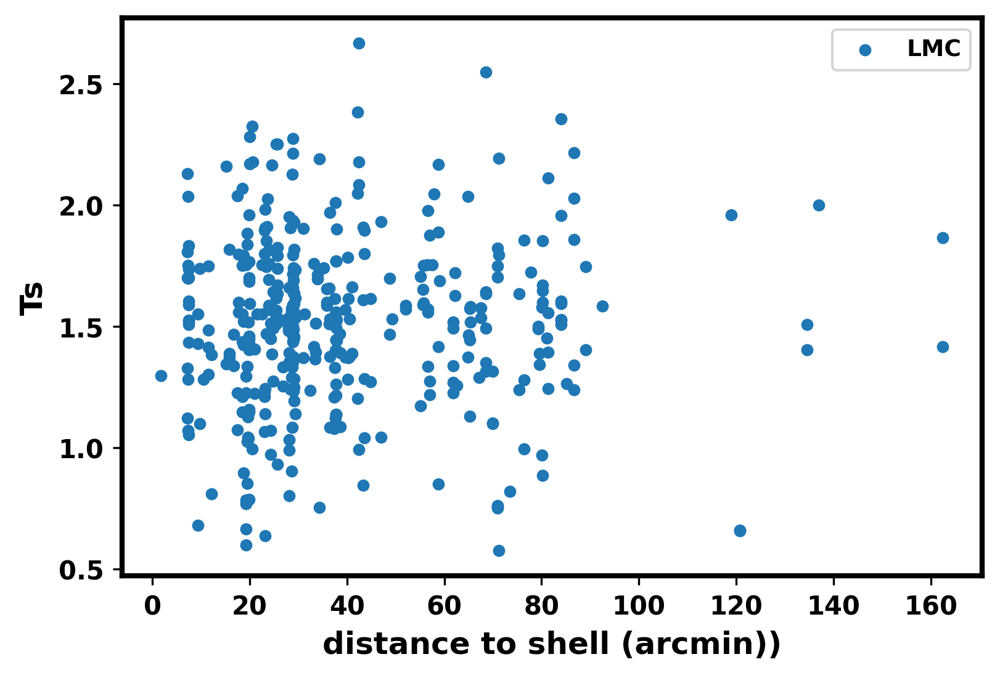

In [70]:
ra=CNMonlydata.ra.to_numpy().astype(float)
dec=CNMonlydata.dec.to_numpy().astype(float)
Ts=CNMonlydata.mean_Ts.to_numpy().astype(float)
tau=CNMonlydata.popt0.to_numpy().astype(float)
vpeak=CNMonlydata.popt1.to_numpy().astype(float)
fwhm=CNMonlydata.fwhm.to_numpy().astype(float)

'''
def dis_close_shell(ra,dec,ra_shell,dec_shell):
    distance=[]
    for i,r in enumerate(ra):
        d=dec[i]
        dis =np.sqrt((ra_shell-r)**2+(dec_shell-d)**2)
        distance.append(np.min(dis))
    return distance
'''

distance_to_shell=anap.dis_close_shell(ra,dec,Ra_shell,Dec_shell)

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

plt.scatter(distance_to_shell, np.log10(Ts), s=14, label='LMC')

plt.xlabel(r'distance to shell (arcmin))', fontsize=12, fontweight='bold')
plt.ylabel(r'Ts', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

    

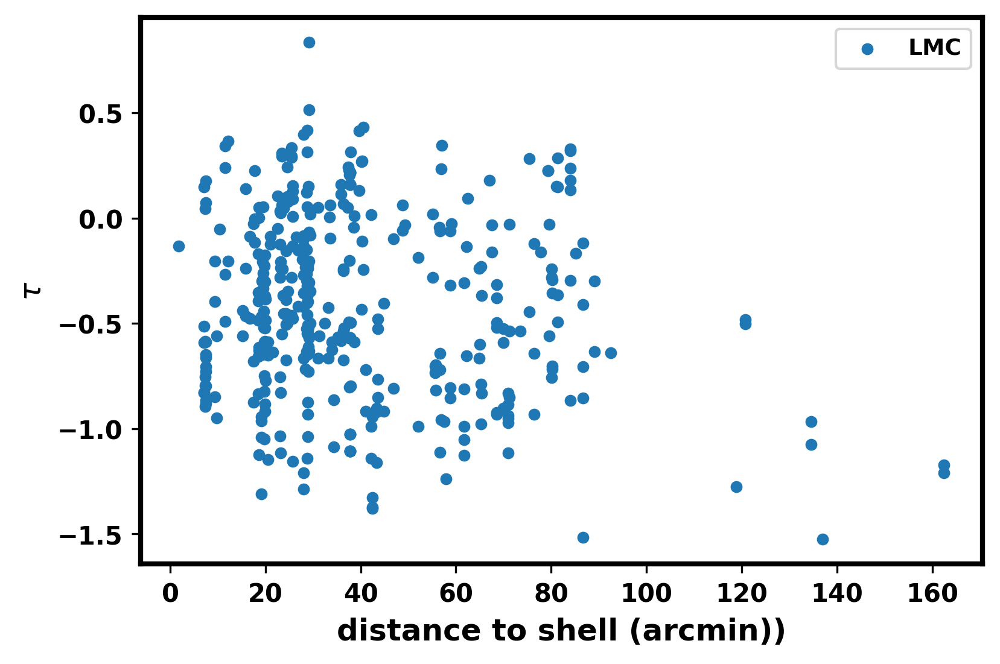

In [25]:
ra=CNMonlydata.ra.to_numpy().astype(float)
dec=CNMonlydata.dec.to_numpy().astype(float)
Ts=CNMonlydata.mean_Ts.to_numpy().astype(float)
tau=CNMonlydata.popt0.to_numpy().astype(float)
vpeak=CNMonlydata.popt1.to_numpy().astype(float)
fwhm=CNMonlydata.fwhm.to_numpy().astype(float)

'''
def dis_close_shell(ra,dec,ra_shell,dec_shell):
    distance=[]
    for i,r in enumerate(ra):
        d=dec[i]
        dis =np.sqrt((ra_shell-r)**2+(dec_shell-d)**2)
        distance.append(np.min(dis))
    return distance
'''

distance_to_shell=anap.dis_close_shell(ra,dec,Ra_shell,Dec_shell)

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

plt.scatter(distance_to_shell, np.log10(tau), s=14, label='LMC')

plt.xlabel(r'distance to shell (arcmin))', fontsize=12, fontweight='bold')
plt.ylabel(r'$\tau$', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

    

In [44]:
np.sum(f_c_LMC>0.5)

10

x<30,mean f= 0.26446954157554586
x>30,mean f= 0.22566399387440228


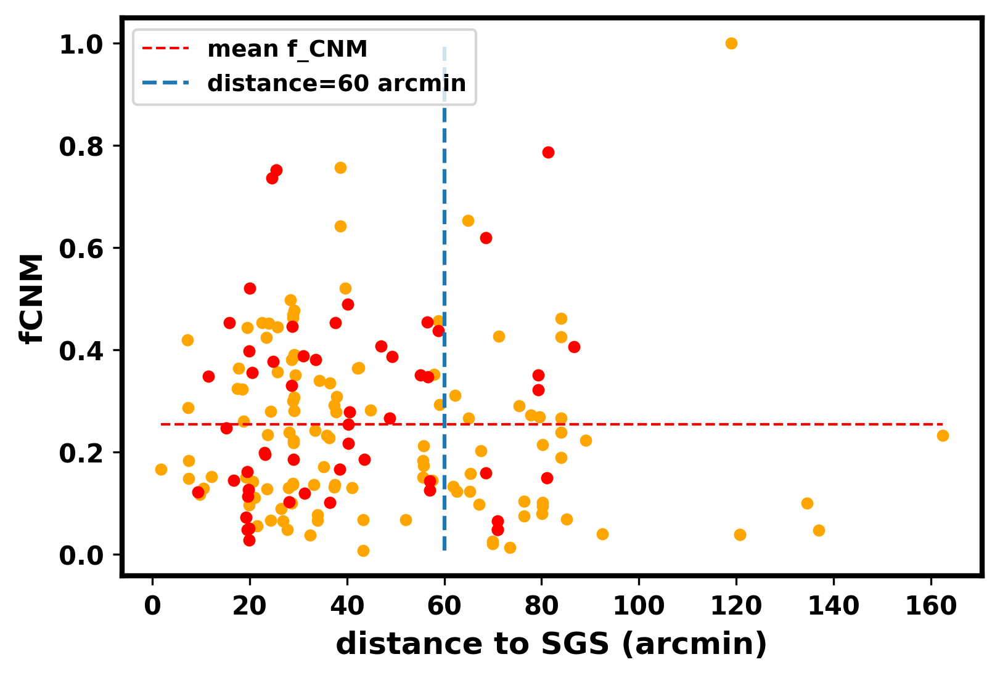

In [38]:
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)

distance_to_shell=anap.dis_close_shell(f_ra,f_dec,Ra_shell,Dec_shell)
distance_to_shell2=anap.dis_close_shell(f_ra,f_dec,Ra_shell_g,Dec_shell_g)

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

plt.scatter(distance_to_shell, f_c_LMC, s=14,c='orange')
plt.hlines(y=np.mean(f_c_LMC),colors='red',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM',linewidths=1)

p=np.argwhere(distance_to_shell2<13).flatten()
plt.scatter(distance_to_shell[p], f_c_LMC[p], s=14,c='red')

x_limit=60
plt.vlines(x=x_limit,colors='tab:blue',ls='--',ymin=np.min(f_c_LMC), ymax=np.max(f_c_LMC),label='distance=%d arcmin'%x_limit )

print('x<30,mean f=',np.mean(f_c_LMC[distance_to_shell<x_limit]))
print('x>30,mean f=',np.mean(f_c_LMC[distance_to_shell>x_limit]))


plt.xlabel(r'distance to SGS (arcmin)', fontsize=12, fontweight='bold')
plt.ylabel(r'fCNM', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

x<30,mean f= 0.28336646108094393
x>30,mean f= 0.24085435574470937


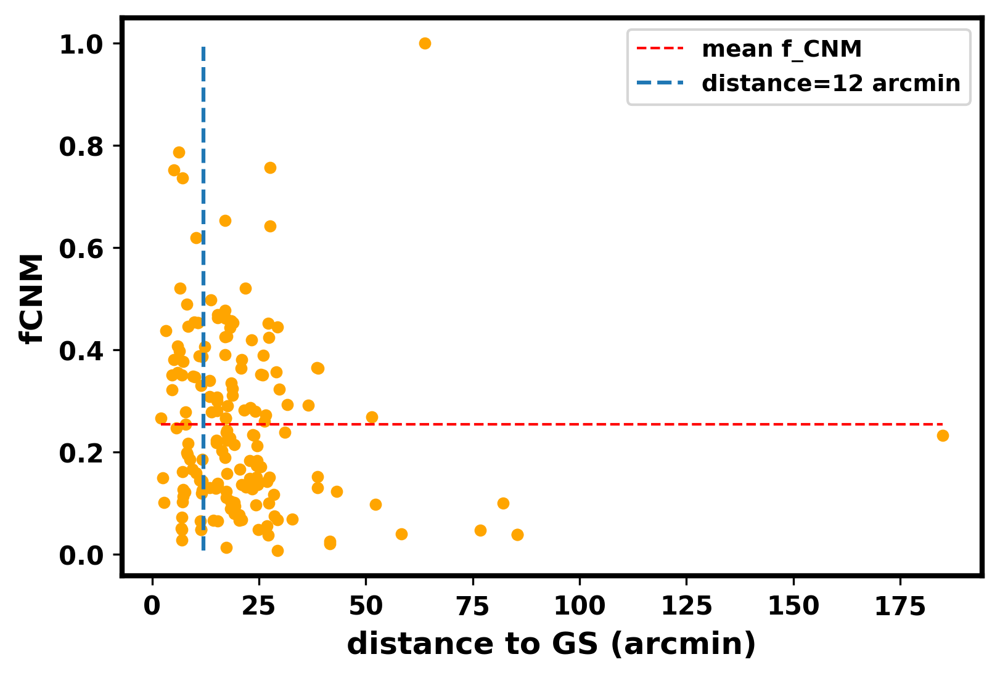

In [33]:
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)

'''
def dis_close_shell(ra,dec,ra_shell,dec_shell):
    distance=[]
    for i,r in enumerate(ra):
        d=dec[i]
        dis =np.sqrt((ra_shell-r)**2+(dec_shell-d)**2)
        distance.append(np.min(dis))
    return np.array(distance)*60
'''
distance_to_shell=anap.dis_close_shell(f_ra,f_dec,Ra_shell_g,Dec_shell_g)


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

plt.scatter(distance_to_shell, f_c_LMC, s=14,c='orange')
plt.hlines(y=np.mean(f_c_LMC),colors='red',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM',linewidths=1)

x_limit=12
plt.vlines(x=x_limit,colors='tab:blue',ls='--',ymin=np.min(f_c_LMC), ymax=np.max(f_c_LMC),label='distance=%d arcmin'%x_limit )

print('x<30,mean f=',np.mean(f_c_LMC[distance_to_shell<x_limit]))
print('x>30,mean f=',np.mean(f_c_LMC[distance_to_shell>x_limit]))


plt.xlabel(r'distance to GS (arcmin)', fontsize=12, fontweight='bold')
plt.ylabel(r'fCNM', fontsize=12, fontweight='bold')
plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

## Dust

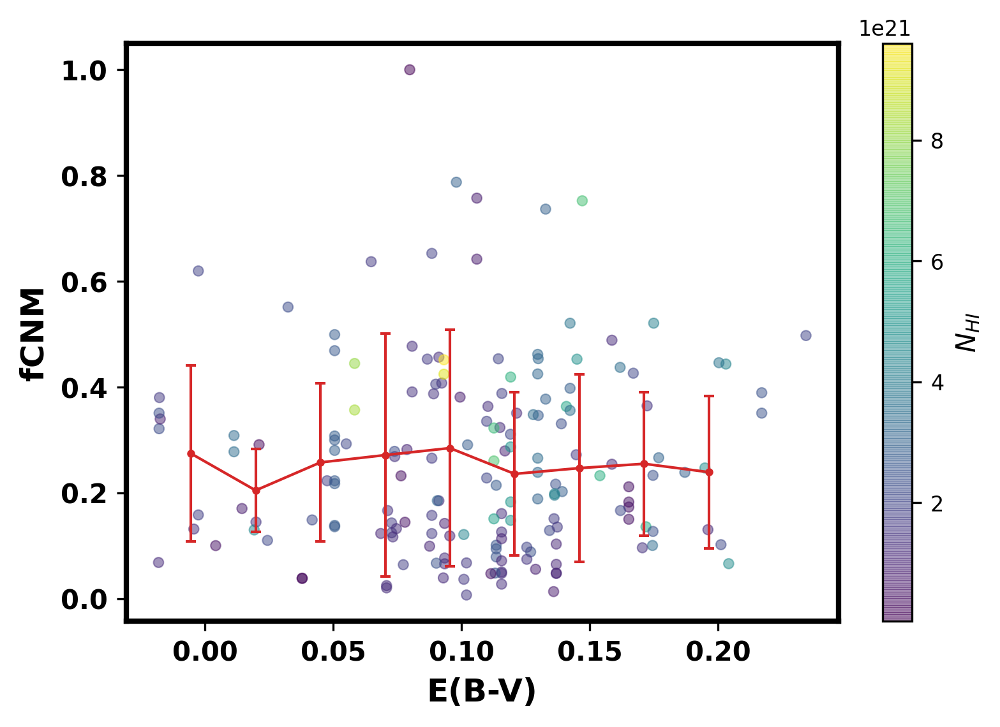

In [67]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20
EBV=Fulldata.EBV.to_numpy().astype(float)


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

x=EBV
y=f_c_LMC
c=a_
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$N_{HI}$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'E(B-V)', fontsize=12, fontweight='bold')
plt.ylabel(r'fCNM', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

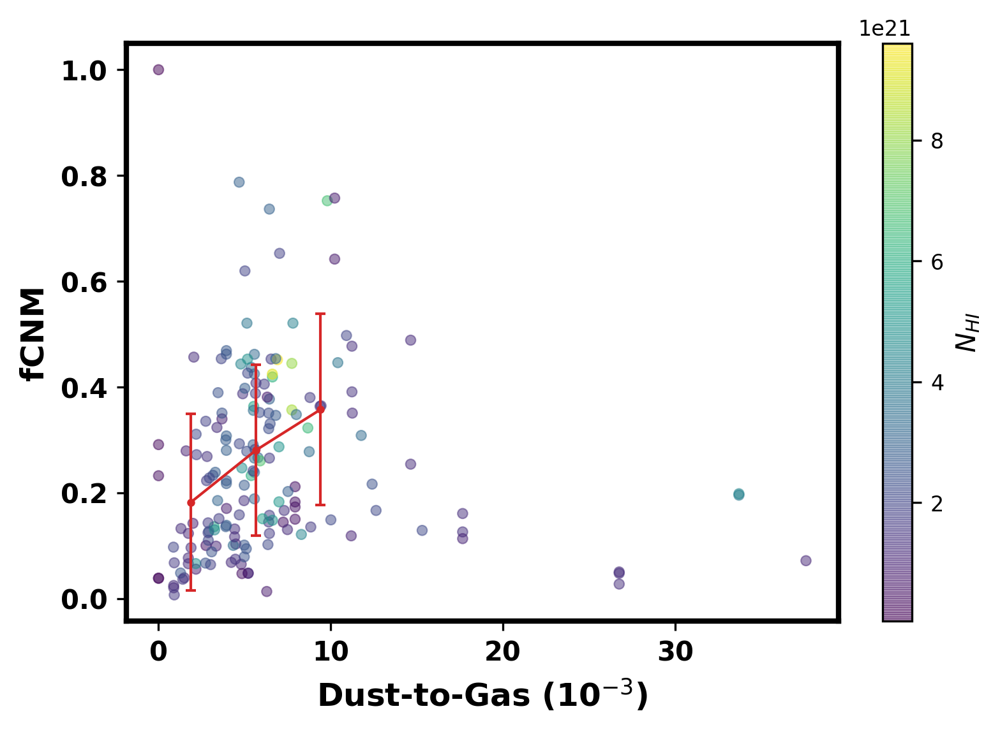

In [37]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20
EBV=Fulldata.DtG.to_numpy().astype(float)


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

x=EBV*1000
y=f_c_LMC
c=a_
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$N_{HI}$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'Dust-to-Gas (10$^{-3}$)', fontsize=12, fontweight='bold')
plt.ylabel(r'fCNM', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

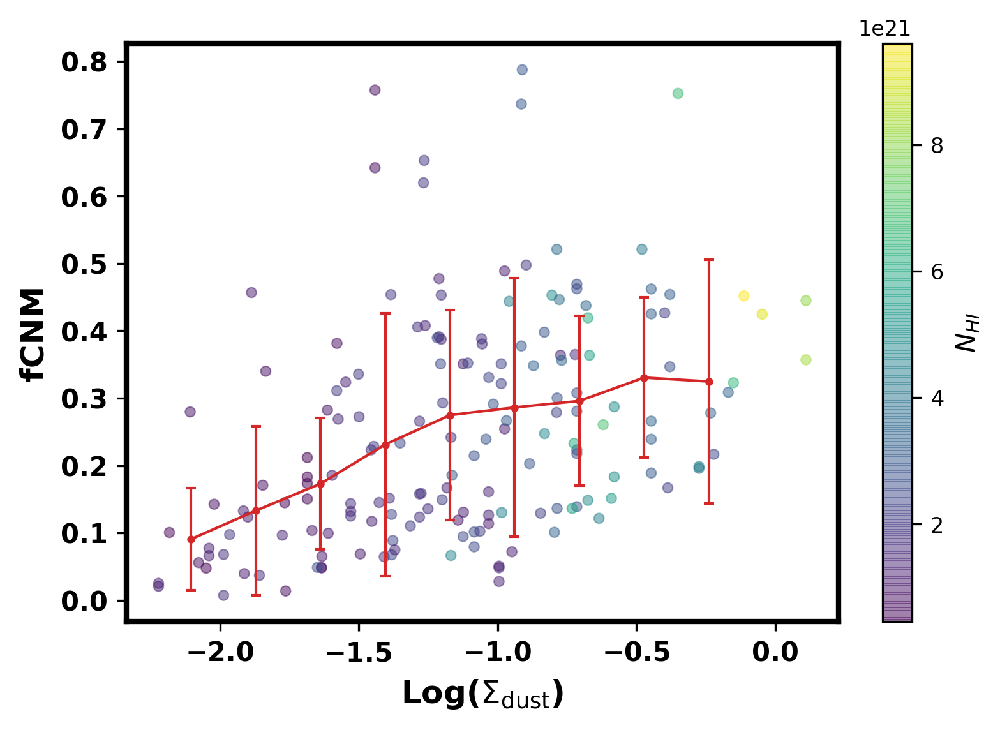

In [26]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20
EBV=Fulldata.Sigma_dust.to_numpy().astype(float)


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

p=np.argwhere(EBV>0.).flatten()
x=np.log10(EBV[p])
y=f_c_LMC[p]
c=a_[p]
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$N_{HI}$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'Log($\mathrm{\Sigma_{dust}}$)', fontsize=12, fontweight='bold')
plt.ylabel(r'fCNM', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

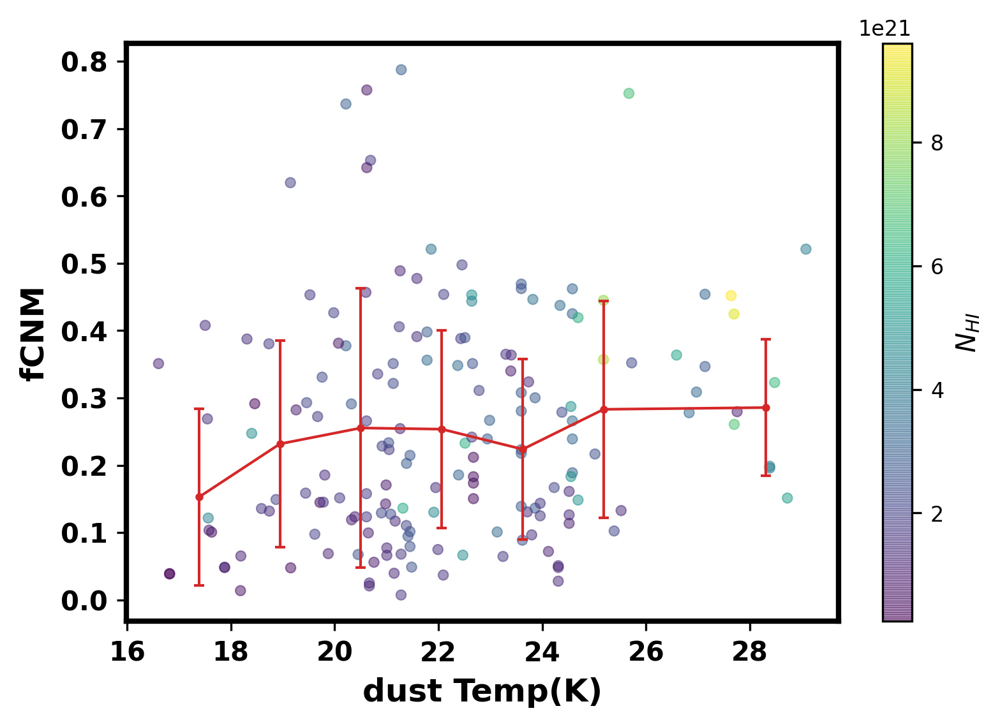

In [65]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20
EBV=Fulldata.dust_T.to_numpy().astype(float)


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

p=np.argwhere(EBV>0.).flatten()
x=EBV[p]
y=f_c_LMC[p]
c=a_[p]
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$N_{HI}$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=8)

plt.xlabel(r'dust Temp(K)', fontsize=12, fontweight='bold')
plt.ylabel(r'fCNM', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

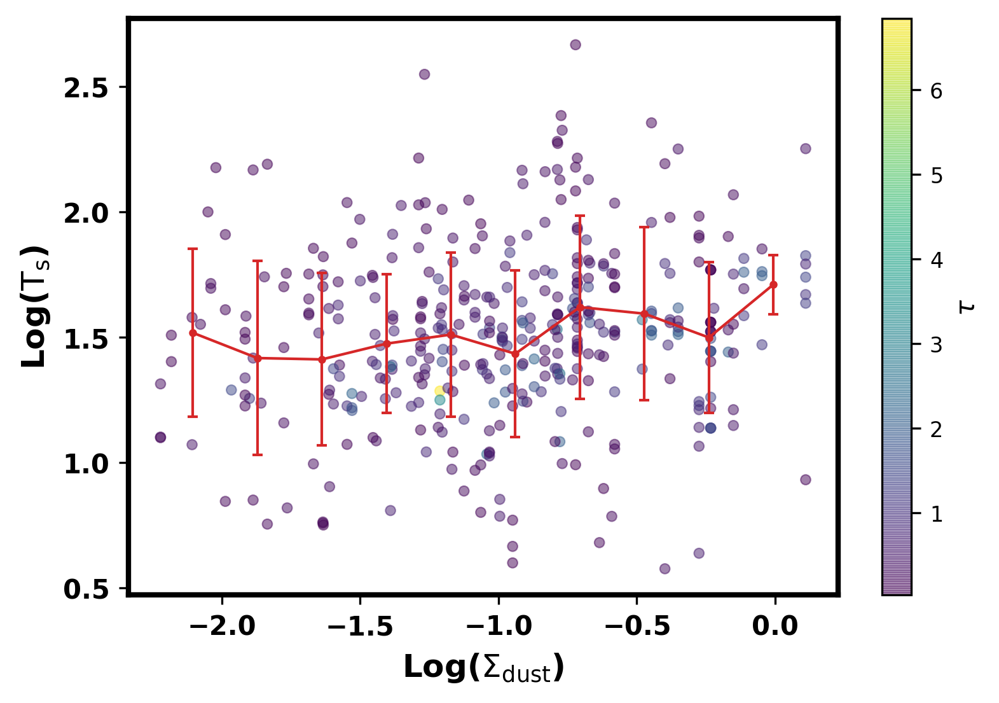

In [46]:
reload(anap)
ra=CNMonlydata.ra.to_numpy().astype(float)
dec=CNMonlydata.dec.to_numpy().astype(float)
Ts=CNMonlydata.mean_Ts.to_numpy().astype(float)
tau=CNMonlydata.popt0.to_numpy().astype(float)
vpeak=CNMonlydata.popt1.to_numpy().astype(float)
fwhm=CNMonlydata.fwhm.to_numpy().astype(float)
EBV=CNMonlydata.Sigma_dust.to_numpy().astype(float)


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

p=np.argwhere(EBV>0.).flatten()
x=np.log10(EBV[p])
y=np.log10(Ts[p])
c=tau[p]
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$\tau$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'Log($\mathrm{\Sigma_{dust}}$)', fontsize=12, fontweight='bold')
plt.ylabel(r'Log($\mathrm{T_s}$)', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

## radial distribution

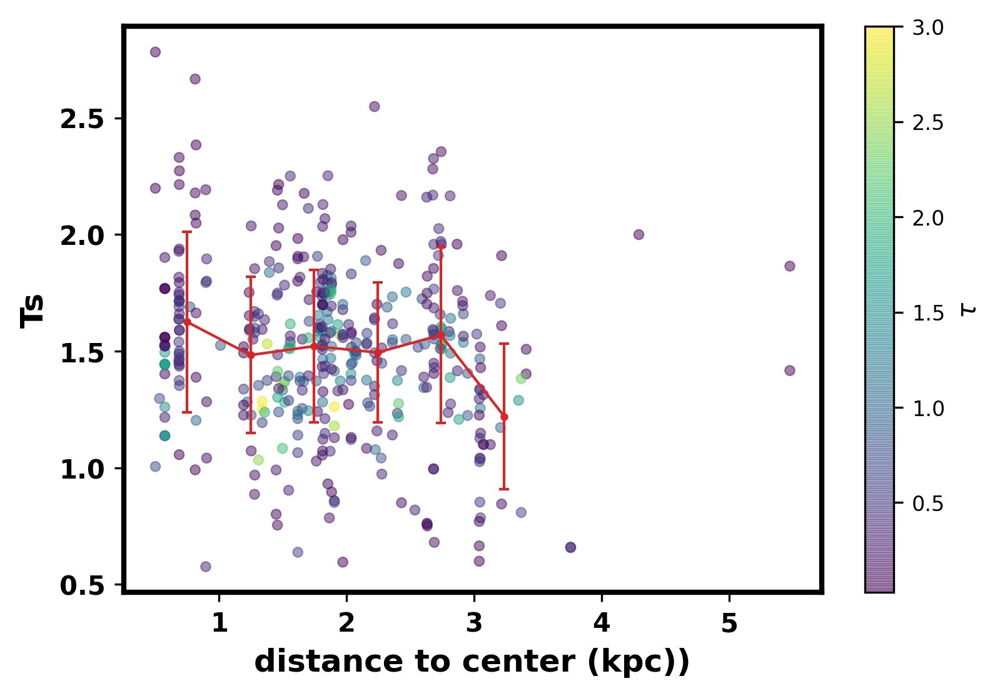

In [67]:
reload(anap)
ra=CNMonlydata.ra.to_numpy().astype(float)
dec=CNMonlydata.dec.to_numpy().astype(float)
Ts=CNMonlydata.mean_Ts.to_numpy().astype(float)
tau=CNMonlydata.popt0.to_numpy().astype(float)
vpeak=CNMonlydata.popt1.to_numpy().astype(float)
fwhm=CNMonlydata.fwhm.to_numpy().astype(float)

'''
def dis_close_shell(ra,dec,ra_shell,dec_shell):
    distance=[]
    for i,r in enumerate(ra):
        d=dec[i]
        dis =np.sqrt((ra_shell-r)**2+(dec_shell-d)**2)
        distance.append(np.min(dis))
    return distance
'''

distance_to_shell=anap.dis_close_shell(ra,dec,[kra_LMC],[kdec_LMC])

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

x=distance_to_shell*60/206265*d_LMC
y=np.log10(Ts)
c=tau
scatter=plt.scatter(x, y, s=14,c=tau,alpha=0.5,linewidths=0.5,vmax=3)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$\tau$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'distance to center (kpc))', fontsize=12, fontweight='bold')
plt.ylabel(r'Ts', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

    

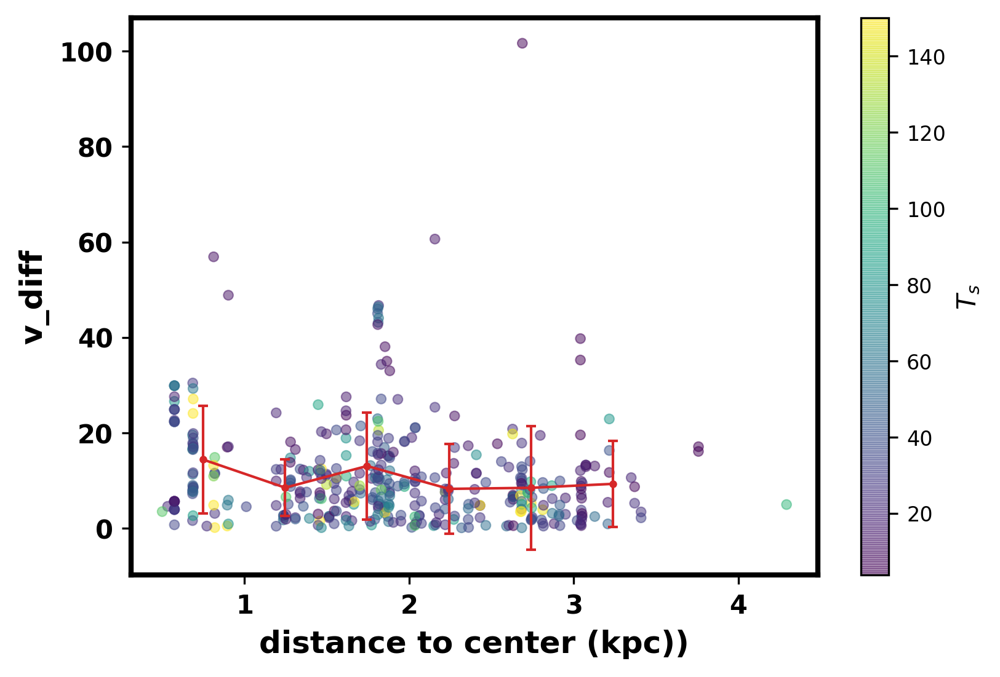

In [57]:
reload(anap)
ra=CNMonlydata.ra.to_numpy().astype(float)
dec=CNMonlydata.dec.to_numpy().astype(float)
Ts=CNMonlydata.mean_Ts.to_numpy().astype(float)
tau=CNMonlydata.popt0.to_numpy().astype(float)
vpeak=CNMonlydata.popt1.to_numpy().astype(float)
v_shift=CNMonlydata.v_shift.to_numpy().astype(float)
fwhm=CNMonlydata.fwhm.to_numpy().astype(float)

f=datapathbase+'/GASKAP_data/NHI_moment1_LMC.fits'
ve=anap.find_moment1(ra,dec,f,R_out=8,R_in=4)
#vcor=[rap.lsr_to_helio_corr(Ra__low[i],Dec__low[i]) for i in range(len(Ra__low))]
shift_LMC=abs(ve-vpeak-v_shift)

plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)
x=distance_to_shell*60/206265*d_LMC
y=shift_LMC
c=Ts
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,vmax=150)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$T_s$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'distance to center (kpc))', fontsize=12, fontweight='bold')
plt.ylabel(r'v_diff', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters

ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')


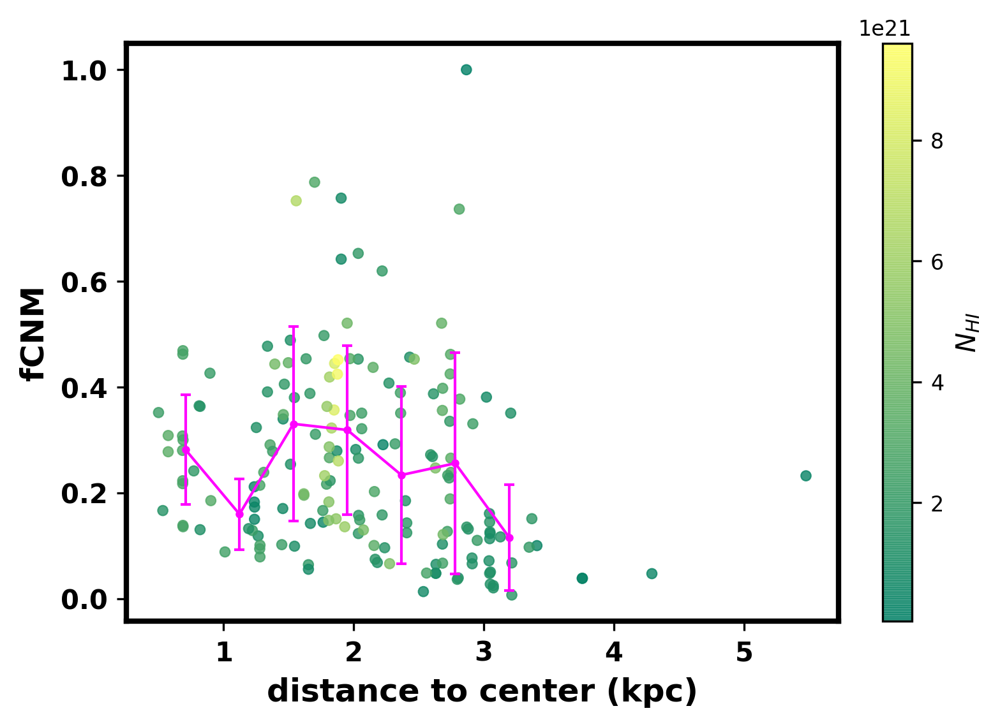

In [24]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20

distance_to_shell=anap.dis_close_shell(f_ra,f_dec,[kra_LMC],[kdec_LMC])


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

x=distance_to_shell*60/206265*d_LMC
y=f_c_LMC
c=a_
#x=x[y<0.5]
#c=c[y<0.5]
#y=y[y<0.5]

scatter=plt.scatter(x, y, s=14,c=c,alpha=0.8,linewidths=0.5,cmap='summer')
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$N_{HI}$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=12)

plt.xlabel(r'distance to center (kpc)', fontsize=12, fontweight='bold')
plt.ylabel(r'fCNM', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

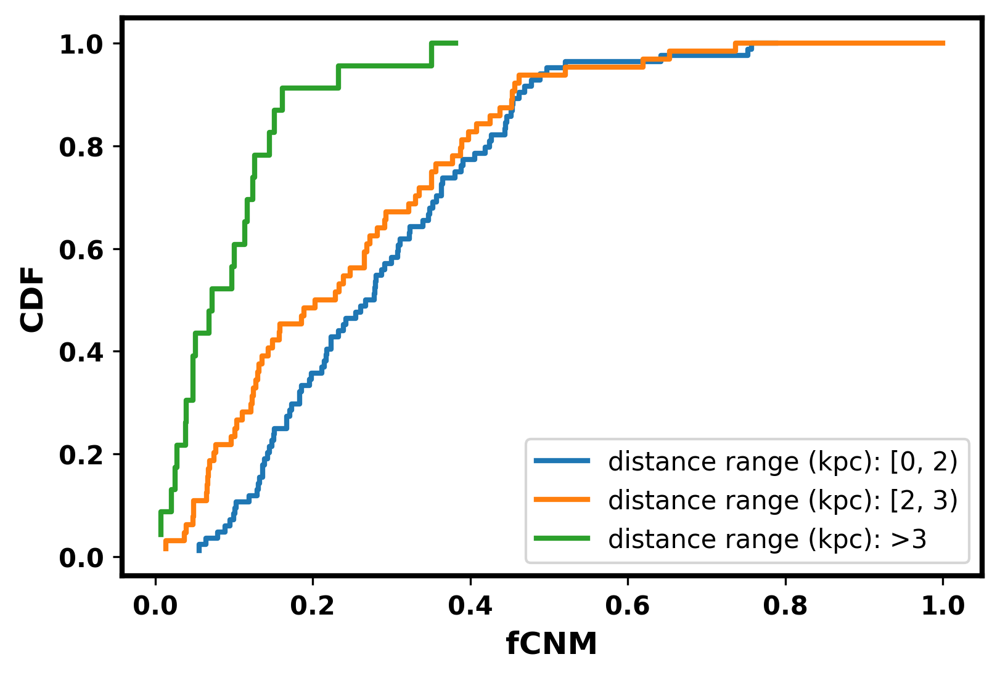

In [36]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20

distance_to_shell=anap.dis_close_shell(f_ra,f_dec,[kra_LMC],[kdec_LMC])


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

x=distance_to_shell*60/206265*d_LMC
y=f_c_LMC
c=a_
#x=x[y<0.5]
#c=c[y<0.5]
#y=y[y<0.5]

bin_edges = [0, 2, 3, 10]  # Manually assigned bin edges for x-values

anap.plot_cdf_with_bins(x, y, bin_edges)

plt.legend()
plt.xlabel('fCNM',fontsize=12, fontweight='bold')
plt.ylabel('CDF',fontsize=12, fontweight='bold')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

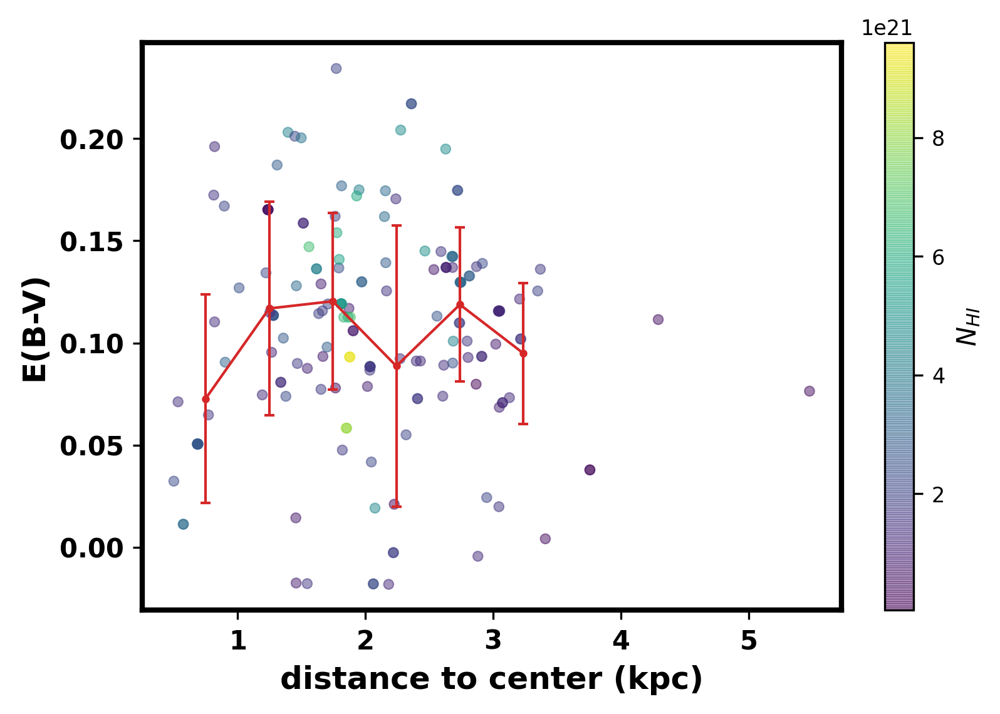

In [72]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20
EBV=Fulldata.EBV.to_numpy().astype(float)

distance_to_shell=anap.dis_close_shell(f_ra,f_dec,[kra_LMC],[kdec_LMC])


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

x=distance_to_shell*60/206265*d_LMC
y=EBV
c=a_
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$N_{HI}$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'distance to center (kpc)', fontsize=12, fontweight='bold')
plt.ylabel(r'E(B-V)', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

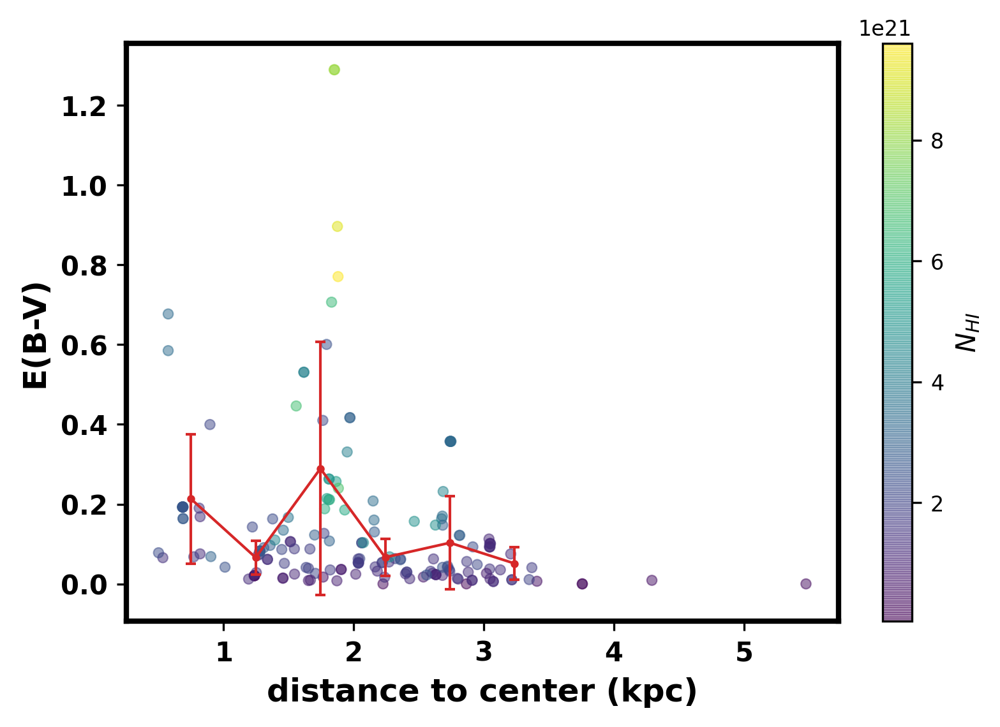

In [47]:
reload(anap)
f_ra=Fulldata.ra.to_numpy().astype(float)
f_dec=Fulldata.dec.to_numpy().astype(float)
f_c_LMC=Fulldata.f_c.to_numpy().astype(float)
a_=Fulldata.NHI_c.to_numpy().astype(float)*1e20 + Fulldata.NHI_w.to_numpy().astype(float)*1e20
EBV=Fulldata.Sigma_dust.to_numpy().astype(float)

distance_to_shell=anap.dis_close_shell(f_ra,f_dec,[kra_LMC],[kdec_LMC])


plt.figure(dpi=300)
plt.rc('xtick', labelsize=8)
plt.rc('ytick', labelsize=8)

x=distance_to_shell*60/206265*d_LMC
y=EBV
c=a_
scatter=plt.scatter(x, y, s=14,c=c,alpha=0.5,linewidths=0.5,)
# Adding a colorbar with a label for clarity
cbar = plt.colorbar(scatter)
cbar.set_label(r'$N_{HI}$')  # Correct way to set the label
#plt.hlines(y=np.mean(f_c_LMC),colors='tab:blue',ls='--',xmin=np.min(distance_to_shell), xmax=np.max(distance_to_shell),label='mean f_CNM' )
anap.plot_binned_data(x, y,num_bins=10)

plt.xlabel(r'distance to center (kpc)', fontsize=12, fontweight='bold')
plt.ylabel(r'E(B-V)', fontsize=12, fontweight='bold')
#plt.legend(prop={'size': 9, 'weight': 'bold'})
#plt.yscale('log')
#plt.xscale('log')
# Set tick parameters
ax = plt.gca()
ax.tick_params(axis='both', which='major', labelsize=10)
ax.tick_params(axis='both', which='minor', labelsize=8)

# Make the tick labels bold
for tick in ax.xaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

for tick in ax.yaxis.get_major_ticks():
    tick.label1.set_fontsize(10)
    tick.label1.set_fontweight('bold')

# Make the outline of each figure bold
for spine in ax.spines.values():
    spine.set_linewidth(2)
    spine.set_edgecolor('black')

In [72]:
Fulldata['f_c'] = pd.to_numeric(Fulldata['f_c'], errors='coerce')

/usr/users/hchen/.local/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [73]:
Fulldata[Fulldata['f_c']>0.9]

,Name,NHI_c,Sigma_NHIc,NHI_w,Sigma_NHIw,f_c,Sigma_fc
0,J044047-695217,0.40946783,0.02885549,0,0.0,1.0,0.


In [70]:
Fulldata['f_c']

0                       1.
1        0.437472649278753
2      0.03903010570275052
3       0.0386065405880796
4      0.21671130920577839
              ...         
213    0.27905495073755354
214    0.27905495073755354
215    0.12598300723541658
216     0.3228813496741767
217     0.7523321806498725
Name: f_c, Length: 174, dtype: object